# Intermediate Machine Learning: Assignment 3

**Deadline**

Assignment 3 is due Thursday, October 30 by 11:59pm. Late work will not be accepted as per the course policies (see the Syllabus and Course policies on Canvas).

Directly sharing answers is not okay, but discussing problems with the course staff or with other students is encouraged. Acknowledge any use of an AI system such as ChatGPT or Copilot.


You should start early so that you have time to get help if you're stuck. The drop-in office hours schedule can be found on Canvas. You can also post questions or start discussions on Ed Discussion. The assignment may look long at first glance, but the problems are broken up into steps that should help you to make steady progress.

**Submission**

Submit your assignment as a pdf file on Gradescope, and as a notebook (.ipynb) on Canvas. You can access Gradescope through Canvas on the left-side of the class home page. The problems in each homework assignment are numbered. Note: When submitting on Gradescope, please select the correct pages of your pdf that correspond to each problem. This will allow graders to more easily find your complete solution to each problem.

To produce the .pdf, please convert to html and then print to pdf. (You may want to use your pdf print menu to scale the pages to be sure that cells are not truncated.) To convert to html, you can use this [converter notebook](https://colab.research.google.com/github/YData123/sds365-fa25/blob/main/assignments/Convert_ipynb_to_HTML_in_Colab.ipynb).

**Topics**

 * Variational autoencoders (VAEs)
 * Undirected graphs
 * The graphical lasso



## Problem 1: Face time (35 points)

In this problem, we will implement a "shoestring" version of [this amazing fake face generator](https://www.nytimes.com/interactive/2020/11/21/science/artificial-intelligence-fake-people-faces.html), using a variational autoencoder (VAE). Building a generator like the one featured in the article can take a tremendous amount of computational resources, time, and parameter tuning. In this problem we will build a basic version to illustrate the main concepts, and help you to become more famililar with VAEs.  Here is an outline of the process that we'll step you through:

### Problem outline:

* Load data
* Create face groups based on attributes
* Construct the VAE
* Define the loss function and train the VAE (Problem 1.1)
* Encode and reconstruct faces (Problem 1.2)
* Visualize the latent space (Problem 1.3)
* Morph between faces (Problem 1.4)
* Shift attributes of faces (Problem 1.5)
* Generate new faces (Problem 1.6)
* Analyze the effect of the scaling factor in the loss function (Problem 1.7, optional)

In the next cell we load the packages that we'll need. If you don't have one or more of these, you can install them with `!pip install <package_name>` in the cell, or outside the notebook
with `conda install -c conda-forge <package_name>`

In [1]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import os
import glob
import pandas as pd
import random
import numpy as np
import imageio
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
from scipy.stats import norm
import tensorflow
# tensorflow.compat.v1.disable_eager_execution()

### Loading the data

[Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) is a database of face photographs. The images are placed in the folder lfw-deepfunneled. lfw_attributes.txt is a document including a set of attributes associated for each image, such as 'Male', 'Smile', 'Bold', etc. All the features are numerical and large positive values indicate that the keywords well describe the photo; large negative values indicate that the keywords don't fit the photo.

For this problem, we will keep only the middle parts of the photos to avoid complex backgrounds.

Download the data from the cloud at these URLs:

https://sds365.s3.amazonaws.com/lfw/lfw-deepfunneled.zip
<br>
https://sds365.s3.amazonaws.com/lfw/lfw_attributes.txt

Once you have the data, unzip it, and place it in a directory that we will call "YOUR_PATH" below.
  
Run all the cells in this section to load the data.

Note: Please write down the entire path instead of using something like '~/Desktop/datasets/' to avoid unnecessary compiling errors. Also, if you choose to use Colab to do your homework. We need to download the data into the same directory as your code. You may also need

"from google.colab import drive"

"drive.mount('/content/drive')"

to enable using paths in Google Drive before starting your code below. But personally, I would suggest using jupyter notebook to run the code locally instead of using Google Colab since the latter may take longer time.

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls /content/drive/MyDrive/lfw_data

!mkdir -p /content/lfw_data

!cp "/content/drive/MyDrive/lfw_data/lfw-deepfunneled.zip" /content/lfw_data/
!cp "/content/drive/MyDrive/lfw_data/lfw_attributes.txt" /content/lfw_data/

%cd /content/lfw_data
!unzip -q lfw-deepfunneled.zip
!ls -l lfw-deepfunneled | head

In [5]:
# Change these path names to correspond with your directory
DATASET_PATH = "/content/lfw_data/lfw-deepfunneled/"
ATTRIBUTES_PATH = "/content/lfw_data/lfw_attributes.txt"

In [6]:

# Make sure the above path is correct before running this cell
dataset = []
for path in glob.iglob(os.path.join(DATASET_PATH, "**", "*.jpg")):
    person = path.split("/")[-2]
    dataset.append({"person":person, "path": path})

dataset = pd.DataFrame(dataset)
dataset = dataset.groupby("person").filter(lambda x: len(x) < 100 )
dataset.head(10)

,person,path
0,Sherry_Fisher,/content/lfw_data/lfw-deepfunneled/Sherry_Fish...
1,Paul_Reiser,/content/lfw_data/lfw-deepfunneled/Paul_Reiser...
2,Hunter_Bates,/content/lfw_data/lfw-deepfunneled/Hunter_Bate...
3,Douglas_Meester,/content/lfw_data/lfw-deepfunneled/Douglas_Mee...
4,Porter_Goss,/content/lfw_data/lfw-deepfunneled/Porter_Goss...
5,Edmund_Stoiber,/content/lfw_data/lfw-deepfunneled/Edmund_Stoi...
6,Edmund_Stoiber,/content/lfw_data/lfw-deepfunneled/Edmund_Stoi...
7,Edmund_Stoiber,/content/lfw_data/lfw-deepfunneled/Edmund_Stoi...
8,Edmund_Stoiber,/content/lfw_data/lfw-deepfunneled/Edmund_Stoi...
9,Edmund_Stoiber,/content/lfw_data/lfw-deepfunneled/Edmund_Stoi...


The following cell will display some sample images

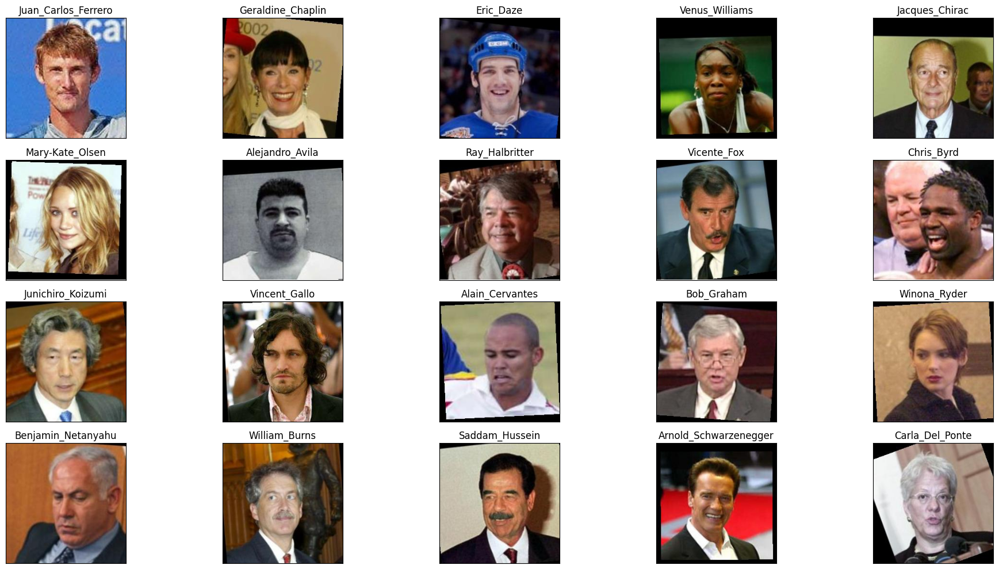

In [7]:
sampled_id = []

plt.figure(figsize=(20,10))
for i in range(20):
    idx = random.randint(0, len(dataset))
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
    sampled_id.append(idx)
plt.tight_layout()
plt.show()

The following cell shows the images with some of the background removed.

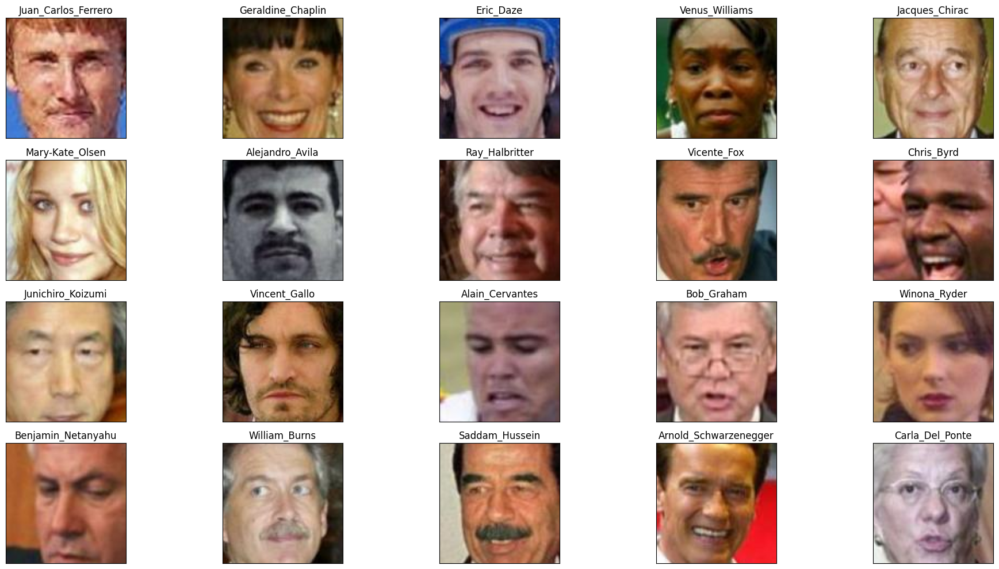

In [8]:
dx=70
dy=70

plt.figure(figsize=(20,10))
for i in range(20):
    idx = sampled_id[i]
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img[dy:-dy,dx:-dx])
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

The following function crops the images to 45x45 pixels, which is what we will use in this problem.

In [9]:
def fetch_dataset(dx=70, dy=70, dimx=45, dimy=45):

    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='\t', skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])

    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    all_photos = df['photo_path'].apply(imageio.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: np.array(Image.fromarray(img).resize([dimx,dimy])) )

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    return all_photos,all_attrs

The variable `data` has all the face images and the variable `attrs` has all the attributes. The 8-bit RGB values are converted to values between 0 and 1 for modeling and plotting purposes.

In [10]:
data, attrs = fetch_dataset()
data = np.array(data / 255, dtype='float32')

### Create Face Groups

We can now create groups of faces, by selecting the faces having the highest or lowest scores for each of the attributes. Run all the cells in this section to create and plot some face groups.

In [11]:
def plot_gallery(images, h, w, n_row=3, n_col=6, with_title=False, titles=[]):
    plt.figure(figsize=(1.75 * n_col, 2 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        try:
            plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
            if with_title:
                plt.title(titles[i])
            plt.xticks(())
            plt.yticks(())
        except:
            pass

In [12]:
IMAGE_H = data.shape[1]
IMAGE_W = data.shape[2]
N_CHANNELS = 3

In [13]:
smile_ids = attrs['Smiling'].sort_values(ascending=False).head(36).index.values
smile_data = data[smile_ids]

no_smile_ids = attrs['Smiling'].sort_values(ascending=True).head(36).index.values
no_smile_data = data[no_smile_ids]

eyeglasses_ids = attrs['Eyeglasses'].sort_values(ascending=False).head(36).index.values
eyeglasses_data = data[eyeglasses_ids]

sunglasses_ids = attrs['Sunglasses'].sort_values(ascending=False).head(36).index.values
sunglasses_data = data[sunglasses_ids]

mustache_ids = attrs['Mustache'].sort_values(ascending=False).head(36).index.values
mustache_data = data[mustache_ids]

male_ids = attrs['Male'].sort_values(ascending=False).head(36).index.values
male_data = data[male_ids]

female_ids = attrs['Male'].sort_values(ascending=True).head(36).index.values
female_data = data[female_ids]

eyeclosed_ids = attrs['Eyes Open'].sort_values(ascending=True).head(36).index.values
eyeclosed_data = data[eyeclosed_ids]

mouthopen_ids = attrs['Mouth Wide Open'].sort_values(ascending=False).head(36).index.values
mouthopen_data = data[mouthopen_ids]

makeup_ids = attrs['Heavy Makeup'].sort_values(ascending=False).head(36).index.values
makeup_data = data[makeup_ids]

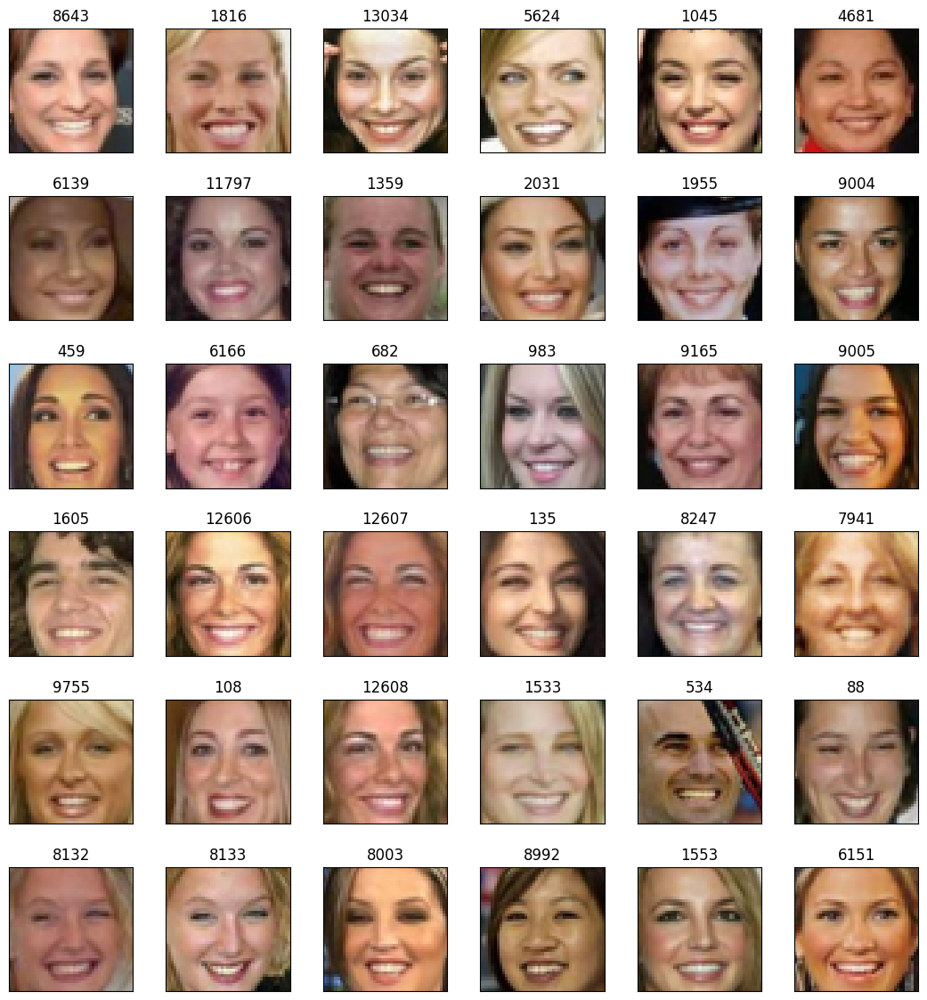

In [14]:
plot_gallery(smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=smile_ids)

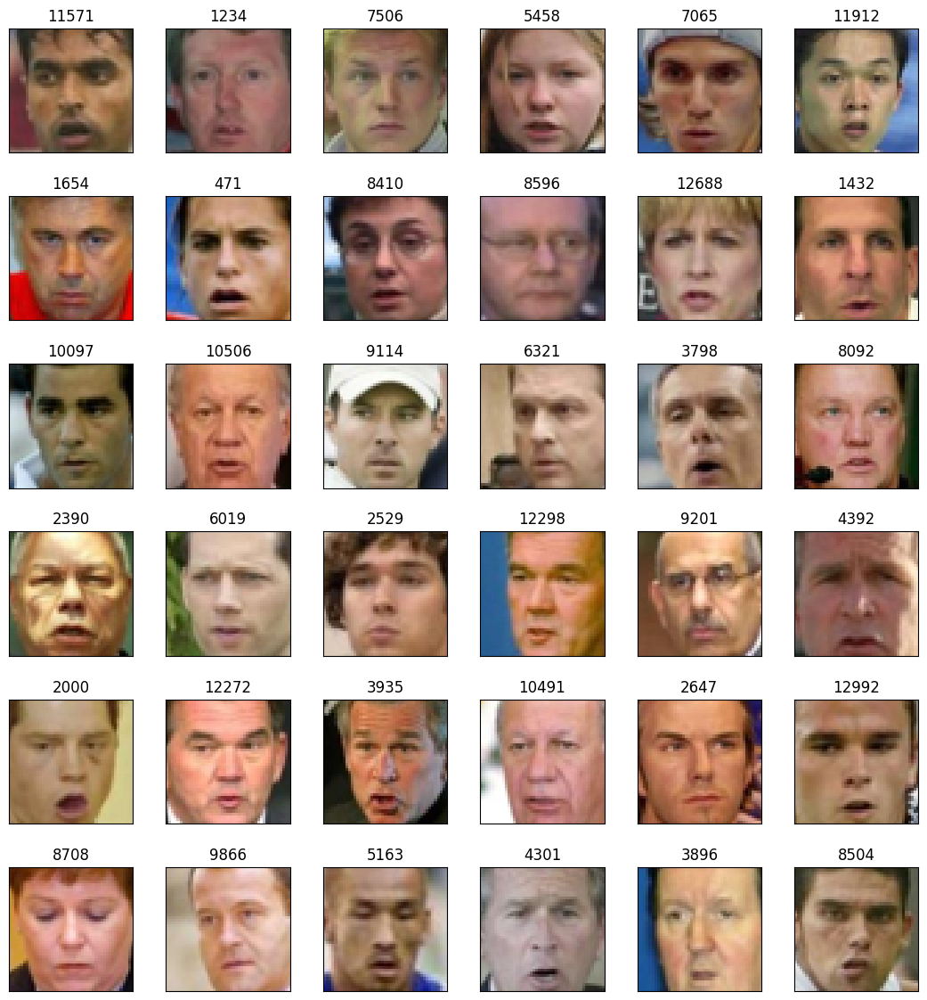

In [15]:
plot_gallery(no_smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=no_smile_ids)

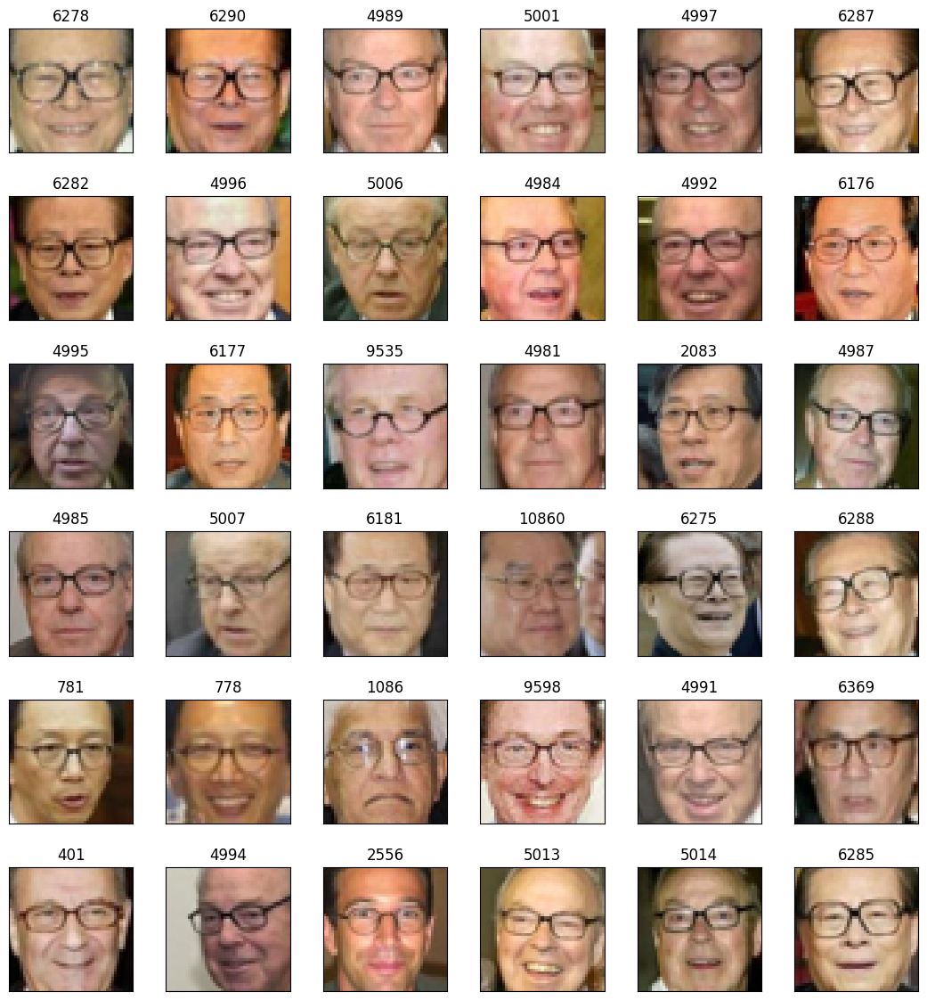

In [16]:
plot_gallery(eyeglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeglasses_ids)

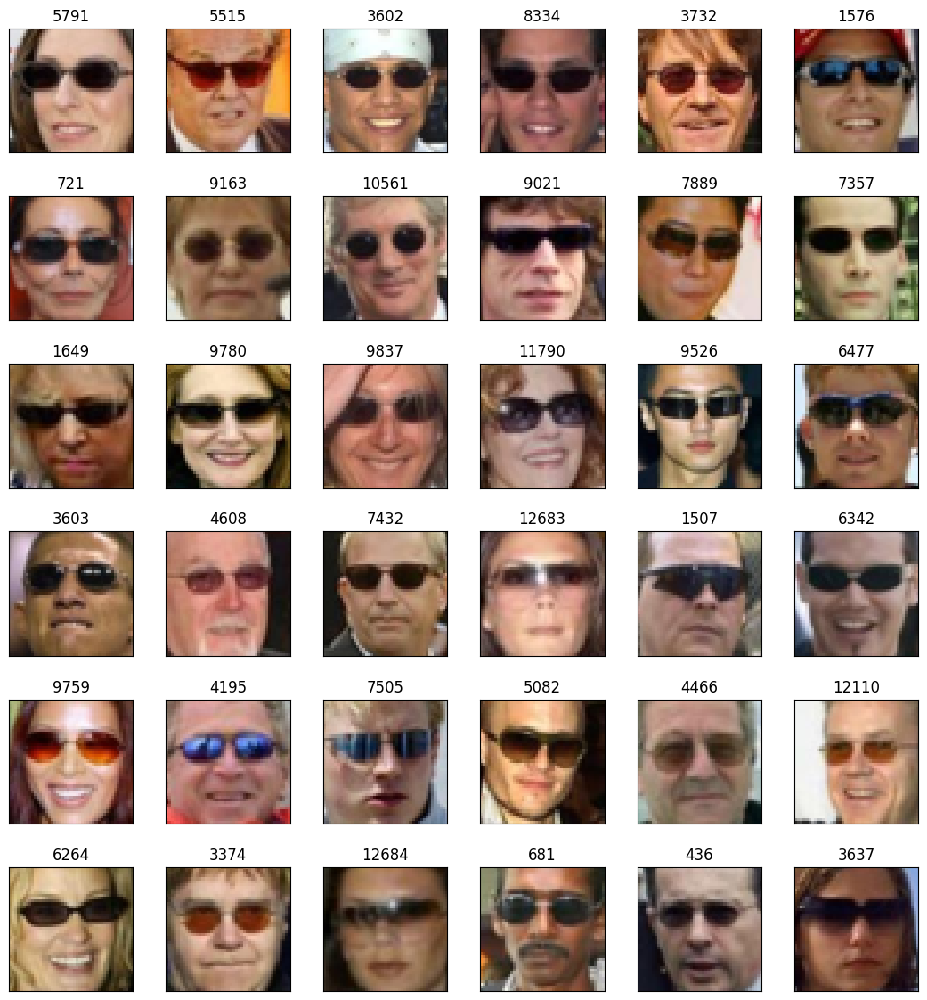

In [17]:
plot_gallery(sunglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=sunglasses_ids)

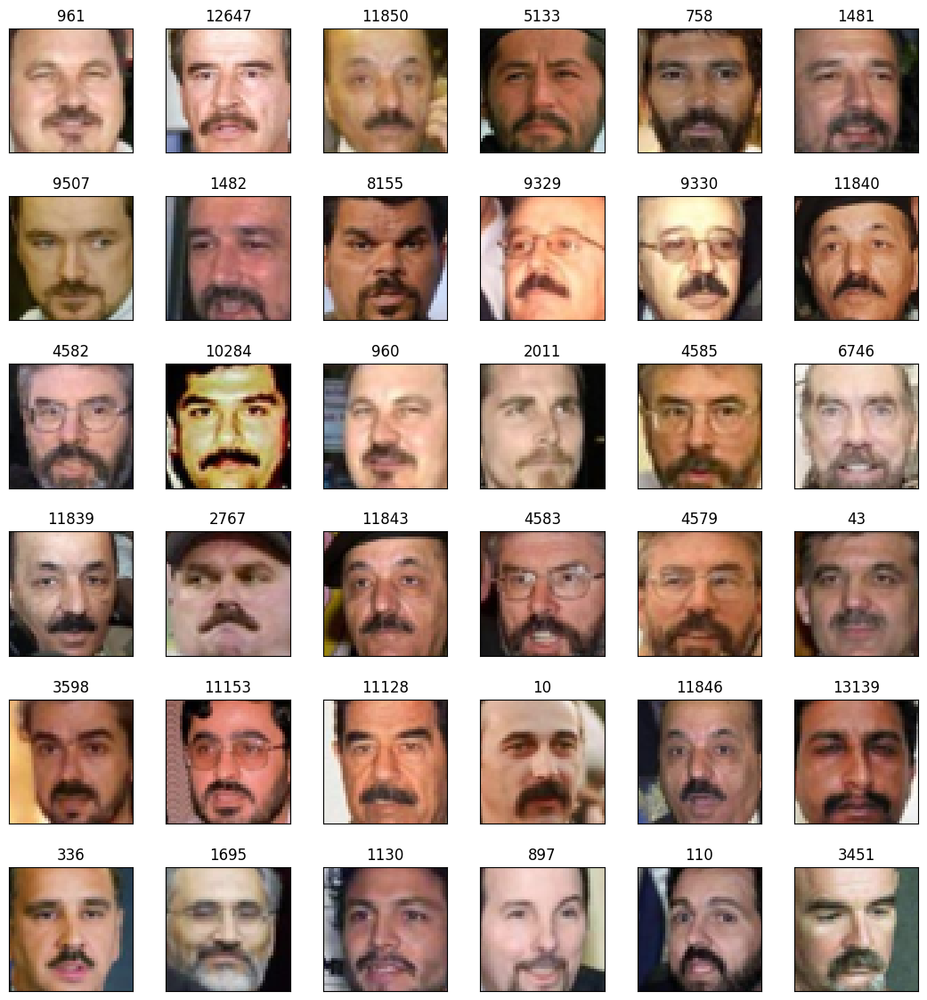

In [18]:
plot_gallery(mustache_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mustache_ids)

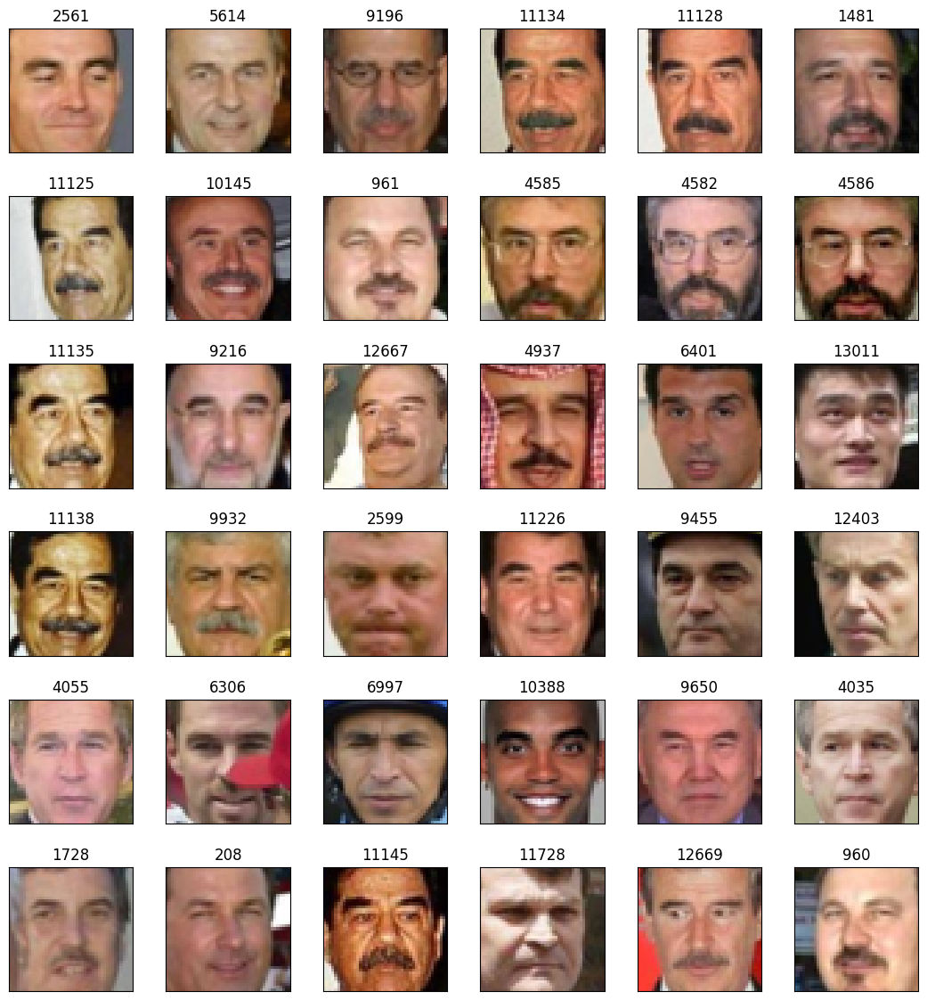

In [19]:
plot_gallery(male_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=male_ids)

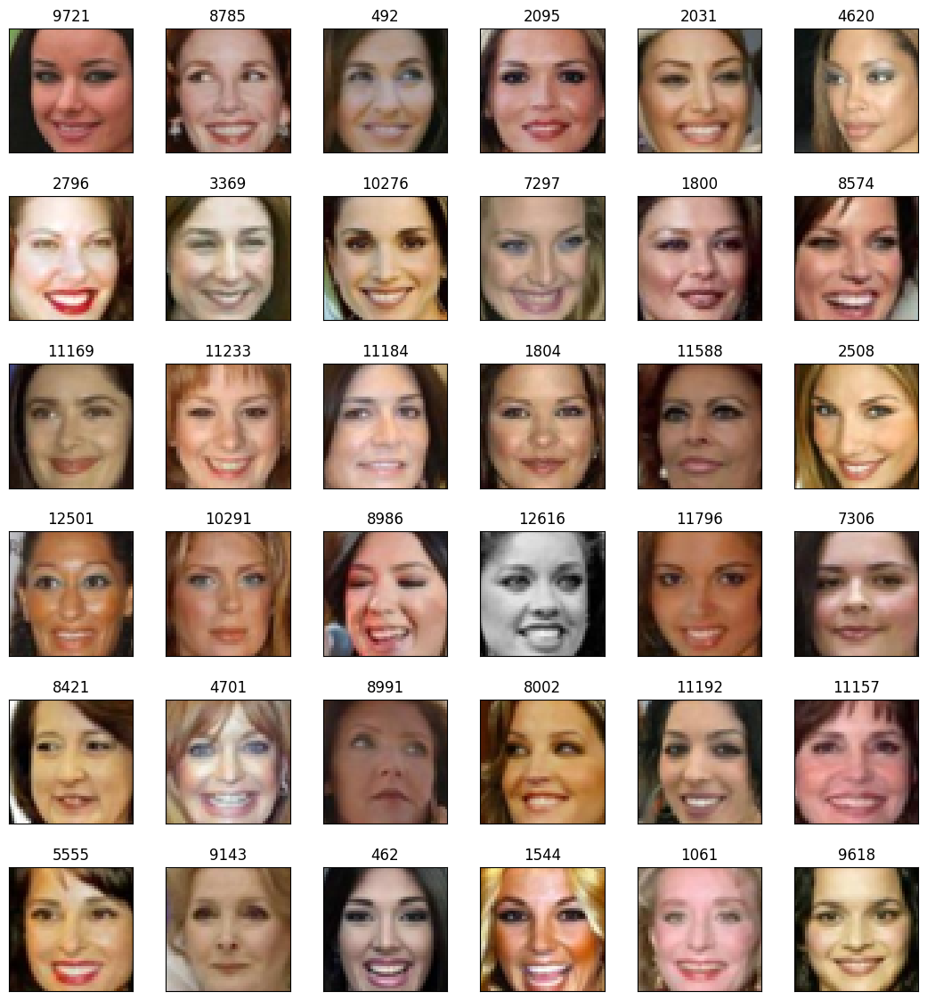

In [20]:
plot_gallery(female_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=female_ids)

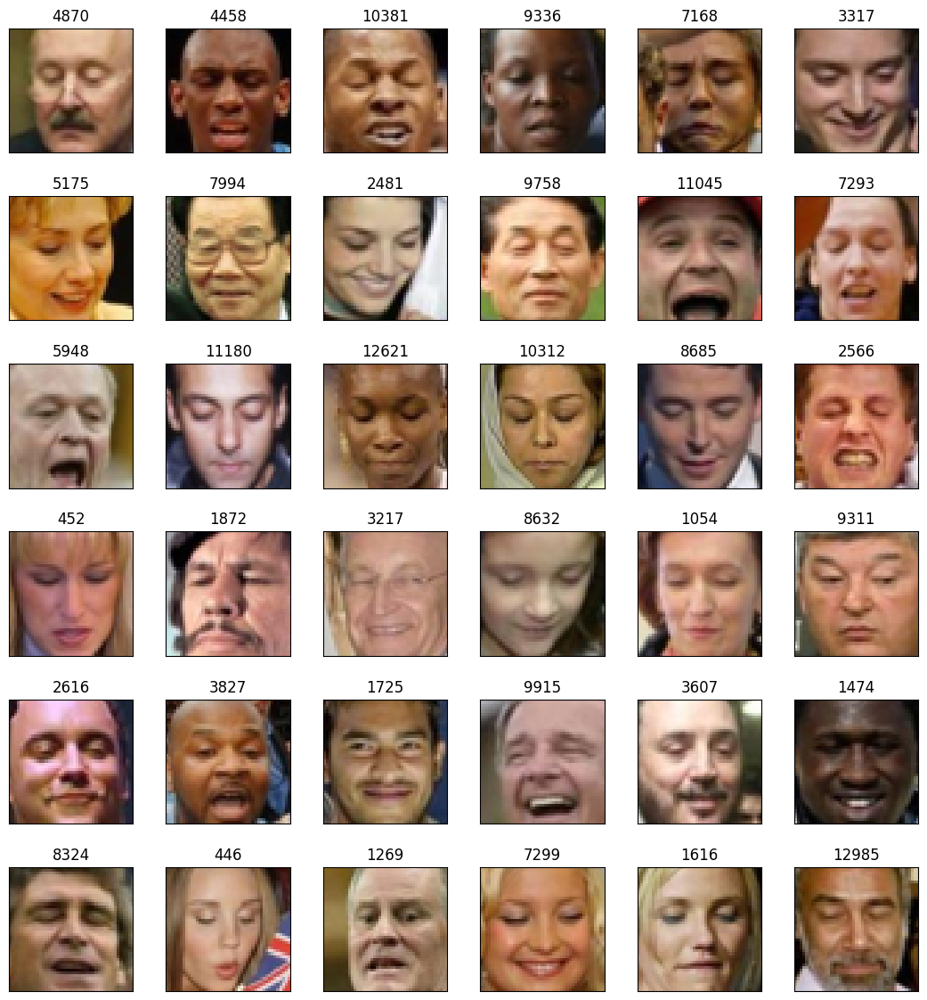

In [21]:
plot_gallery(eyeclosed_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeclosed_ids)

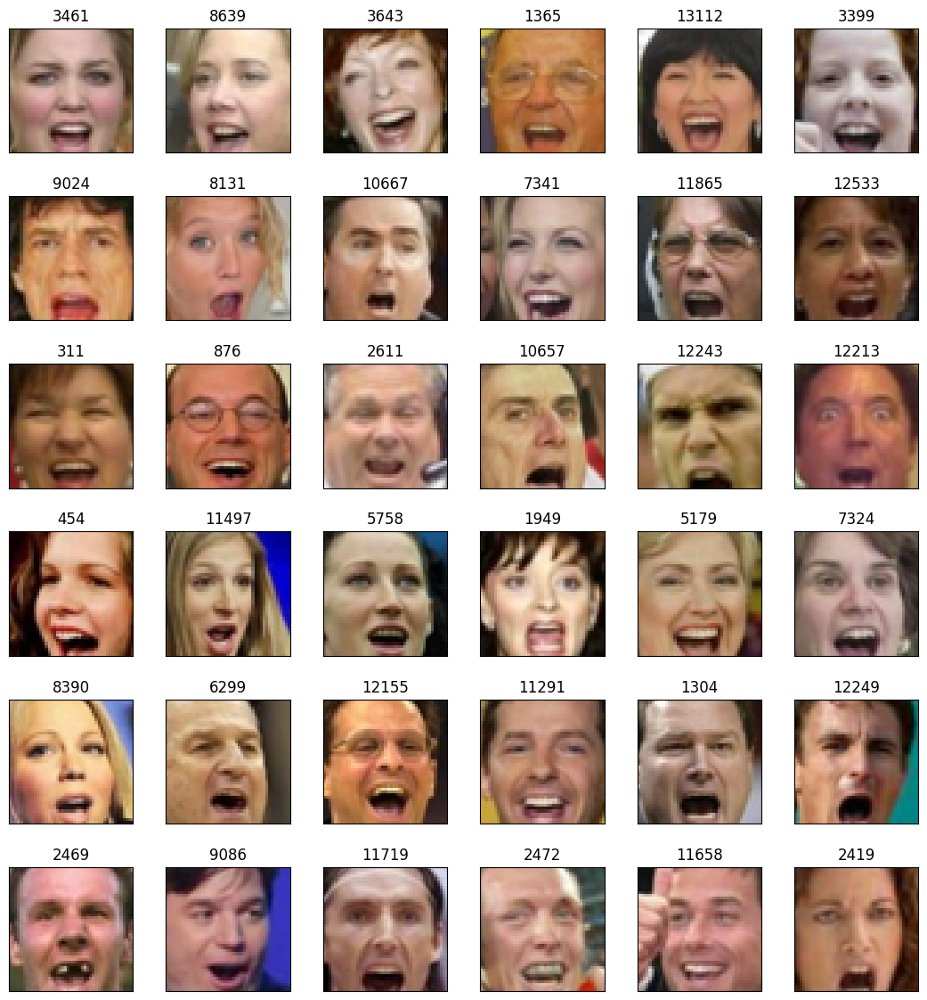

In [22]:
plot_gallery(mouthopen_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mouthopen_ids)

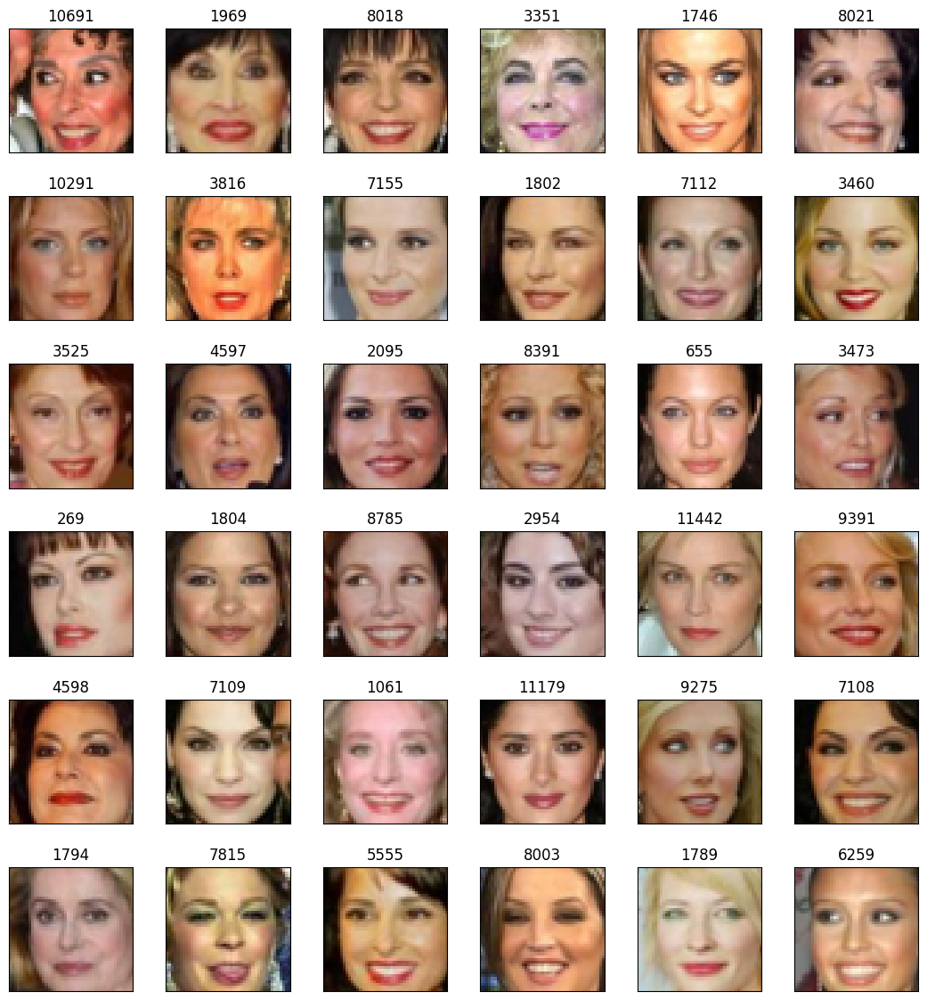

In [23]:
plot_gallery(makeup_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=makeup_ids)

### Constructing the encoder

Recall that the encoder part of the VAE architecture maps a data point to a variational mean and (log) variance. The mean is a point in the latent space.


In [24]:
LATENT_SPACE_SIZE = 100

The "reparameterization trick" draws samples from the variational distribution that are parameterized by the variational mean and variance, so that the parameters of the encoder network can be trained.


In [25]:
def sample_latent_features(distribution):
    distribution_mean, distribution_variance = distribution
    batch_size = tensorflow.shape(distribution_variance)[0]
    random = tensorflow.keras.backend.random_normal(shape=(batch_size, tensorflow.shape(distribution_variance)[1]))
    return distribution_mean + tensorflow.exp(0.5 * distribution_variance) * random

In [26]:
input_data = tensorflow.keras.layers.Input(shape=(45, 45, 3))

encoder = tensorflow.keras.layers.Conv2D(64, (5,5), activation='relu')(input_data)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(64, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(32, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Flatten()(encoder)

distribution_mean = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_mean')(encoder)
distribution_variance = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_log_variance')(encoder)
latent_encoding = tensorflow.keras.layers.Lambda(sample_latent_features)([distribution_mean, distribution_variance])

encoder_model = tensorflow.keras.Model(input_data, latent_encoding)
encoder_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 45, 45, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 41, 41,    │      4,864 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 20, 20,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 18, 18,    │     36,928 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 9, 9, 64)  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 7, 7, 32)  │     18,464 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 3, 3, 32)  │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 288)       │          0 │ max_pooling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_mean    │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_log_va… │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 100)       │          0 │ variational_mean… │
│                     │                   │            │ variational_log_… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 118,056 (461.16 KB)

 Trainable params: 118,056 (461.16 KB)

 Non-trainable params: 0 (0.00 B)

### Construct the decoder

The decoder network in the VAE architecture maps a latent vector to an image.
This is done with a series of transposed convolutional layers, since it must
map from low to high dimensions.


In [27]:
decoder_input = tensorflow.keras.layers.Input(shape=(LATENT_SPACE_SIZE,))
decoder = tensorflow.keras.layers.Reshape((1, 1, 100))(decoder_input)
decoder = tensorflow.keras.layers.Conv2DTranspose(64, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(32, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(16, (5,5), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder_output = tensorflow.keras.layers.Conv2DTranspose(3, (6,6), activation='relu')(decoder)

decoder_model = tensorflow.keras.Model(decoder_input, decoder_output)
decoder_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 1, 1, 100)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 3, 3, 64)       │        57,664 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 8, 8, 32)       │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 20, 20, 16)     │        12,816 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 40, 40, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 45, 45, 3)      │         1,731 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 90,675 (354.20 KB)

 Trainable params: 90,675 (354.20 KB)

 Non-trainable params: 0 (0.00 B)

In [28]:
encoded = encoder_model(input_data)
decoded = decoder_model(encoded)
autoencoder = tensorflow.keras.models.Model(input_data, decoded)

In [29]:
def get_loss(distribution_mean, distribution_variance, factor, batch_size):

    def get_reconstruction_loss(y_true, y_pred, factor, batch_size):
        reconstruction_loss = tensorflow.math.squared_difference(y_true, y_pred)
        reconstruction_loss_batch = tensorflow.reduce_sum(reconstruction_loss)/batch_size
        return 0.5*reconstruction_loss_batch*factor

    def get_kl_loss(distribution_mean, distribution_variance, batch_size):
        kl_loss = LATENT_SPACE_SIZE + distribution_variance - tensorflow.square(distribution_mean) - tensorflow.exp(distribution_variance)
        kl_loss_batch = tensorflow.reduce_sum(kl_loss)/batch_size
        return kl_loss_batch*(-0.5)

    def total_loss(y_true, y_pred):
        reconstruction_loss_batch = get_reconstruction_loss(y_true, y_pred, factor, batch_size)
        kl_loss_batch = get_kl_loss(distribution_mean, distribution_variance, batch_size)
        return reconstruction_loss_batch + kl_loss_batch

    return total_loss

In [30]:
from keras import ops, layers, Model
from keras.losses import mean_squared_error as mse

# --- KL layer ---
class KLLoss(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        # KL per sample: -0.5 * sum(1 + logvar - mu^2 - exp(logvar))
        kl_per_sample = -0.5 * ops.sum(1.0 + logvar - ops.square(mu) - ops.exp(logvar), axis=-1)
        self.add_loss(ops.mean(kl_per_sample))  # scalar KL
        return inputs  # pass-through

# 1) Create the KL node
kl_node = KLLoss(name="kl_loss")([distribution_mean, distribution_variance])

# 2) Tie the KL node into the forward graph but keep output = decoded
decoded = layers.Lambda(lambda xs: xs[0], name="with_kl")([decoded, kl_node])

# 3) (Re)build the model so the KL loss is included
autoencoder = tensorflow.keras.models.Model(input_data, decoded, name="autoencoder_with_kl")

# 4) reconstruction loss
def reconstruction_loss(y_true, y_pred, sum_over_channels=False):
    # per-pixel MSE (averaged over channels)
    per_pixel = mse(y_true, y_pred)                 # (B, H, W)
    H = ops.shape(per_pixel)[1]
    W = ops.shape(per_pixel)[2]
    factor = ops.cast(H * W, per_pixel.dtype)
    if sum_over_channels:
        C = ops.shape(y_true)[-1]                   # undo the channel mean
        factor = factor * ops.cast(C, per_pixel.dtype)
    return ops.mean(per_pixel) * factor             # mean over batch, sum over chosen dims

### 1.1 Deriving the loss function (5 points)

Derive the loss function defined in the cell above from the probability model perspective. You can ignore the scalar `factor` in your derivation. Show your work using either LaTeX or a picture of your written solution.

Hint: Think about how how the total loss is related to the ELBO.

[Your derivation here]


### 1.1 Deriving the VAE Loss

We model  

- prior $p(z)=\mathcal N(0,I)$
- posterior $q_\phi(z|x)=\mathcal N(\mu_\phi(x),\mathrm{diag}(\sigma_\phi^2(x)))$
- decoder $p_\theta(x|z)=\mathcal N(f_\theta(z), I)$

Then the Evidence Lower Bound (ELBO) is:

$$
\log p_\theta(x)
\ge
\mathbb{E}_{q_\phi(z|x)}[\log p_\theta(x|z)]
-
\mathrm{KL}\big(q_\phi(z|x)\,\|\,p(z)\big)
$$

We minimize the negative ELBO:

$$
\mathcal{L}(x;\theta,\phi)
=
-\mathbb{E}_{q_\phi(z|x)}[\log p_\theta(x|z)]
+
\mathrm{KL}\big(q_\phi(z|x)\,\|\,p(z)\big)
$$

For a Gaussian decoder $p_\theta(x|z)=\mathcal N(f_\theta(z), I)$,

$$
-\log p_\theta(x|z)
=\tfrac12\|x-f_\theta(z)\|_2^2 + \text{const}
$$

and for Gaussian $q_\phi(z|x)$,

$$
\mathrm{KL}(q_\phi\|p)
=\tfrac12\sum_j(\mu_j^2+\sigma_j^2-\log\sigma_j^2-1)
$$

Combine both terms:

$$
\mathcal{L}(x)
=
\tfrac12\|x-\hat x\|_2^2
+
\tfrac12\sum_j(\mu_j^2+\exp(\text{logvar}_j)-\text{logvar}_j-1)
$$

matches the code:  
- `reconstruction_loss` → first term  
- `KLLoss` → second term  




The following three cells train the model. You can just run them. It may take a while to run on your laptop.

In [31]:
X_train, X_val = train_test_split(data, test_size=0.2, random_state=365)

In [32]:
batch_size = 64
# autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100,
#                                   batch_size = batch_size), optimizer='adam')
autoencoder.compile(optimizer="adam", loss=reconstruction_loss)

autoencoder.summary()

Model: "autoencoder_with_kl"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 45, 45, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 41, 41,    │      4,864 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 20, 20,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 18, 18,    │     36,928 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 9, 9, 64)  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 7, 7, 32)  │     18,464 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 3, 3, 32)  │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 288)       │          0 │ max_pooling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ (None, 100)       │    118,056 │ input_layer[0][0] │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_mean    │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_log_va… │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 45, 45, 3) │     90,675 │ functional[0][0]  │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ kl_loss (KLLoss)    │ [(None, 100),     │          0 │ variational_mean… │
│                     │ (None, 100)]      │            │ variational_log_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ with_kl (Lambda)    │ (None, 45, 45, 3) │          0 │ functional_1[0][… │
│                     │                   │            │ kl_loss[0][0],    │
│                     │                   │            │ kl_loss[0][1]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 208,731 (815.36 KB)

 Trainable params: 208,731 (815.36 KB)

 Non-trainable params: 0 (0.00 B)

In [33]:
autoencoder.fit(X_train, X_train, epochs=50, batch_size=64, validation_data=(X_val, X_val))

Epoch 1/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 148.1192 - val_loss: 72.4096
Epoch 2/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 68.0000 - val_loss: 60.3016
Epoch 3/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 59.0490 - val_loss: 56.2269
Epoch 4/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 55.3642 - val_loss: 53.7992
Epoch 5/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 52.8430 - val_loss: 50.1926
Epoch 6/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 50.4210 - val_loss: 48.9029
Epoch 7/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 49.0318 - val_loss: 47.6453
Epoch 8/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 47.4697 - val_loss: 46.3366
Epoch 9/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 46.9050 - val_loss: 45.6887
Epoch 10/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 45.8324 - val_loss: 45.3389
Epoch 11/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 45.0840 - val_loss: 43.7415
Epoch 12/50
165/1

In [35]:
# Save your trained model (for later use)

# autoencoder.save("My_Trained_VAE")
# encoder_model.save("My_Trained_encoder")
# decoder_model.save("My_Trained_decoder")

autoencoder.save("My_Trained_VAE.keras")
encoder_model.save("My_Trained_encoder.keras")
decoder_model.save("My_Trained_decoder.keras")


If you experience issues while training the models above or if the process is taking too long, you may also use our pre-trained versions of the VAE, encoder, and decoder, which are available on Canvas.

No points will be taken off if you decide to use the pre-trained models, but we do recommend trying out the training process above. In case you encounter any issues when loading in the models, please post your questions on Ed discussion.

In [ ]:
# Load Pre-trained Model

# batch_size = 64
# autoencoder = tensorflow.keras.models.load_model("Trained_VAE",compile=False)

# autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

# encoder_model = tensorflow.keras.models.load_model("Trained_encoder",compile=False)
# encoder_model.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

# decoder_model = tensorflow.keras.models.load_model("Trained_decoder",compile=False)
# decoder_model.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

In [50]:
from tensorflow import keras
import tensorflow as tf
import numpy as np
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# 1)Lambda function
def sample_latent_features(args):
    mu, logvar = args
    eps = tf.random.normal(shape=tf.shape(mu))
    return mu + tf.exp(0.5 * logvar) * eps

encoder_model = keras.models.load_model(
    "/content/drive/MyDrive/assn3_pretrained_model/Encoder.keras",
    compile=False,  # ok for inference
    custom_objects={"sample_latent_features": sample_latent_features},
    safe_mode=False
)

decoder_model = keras.models.load_model(
    "/content/drive/MyDrive/assn3_pretrained_model/Decoder.keras",
    compile=False
)

autoencoder = keras.models.load_model(
    "/content/drive/MyDrive/assn3_pretrained_model/Autoencoder.keras",
    compile=False,
    custom_objects={"sample_latent_features": sample_latent_features},
    safe_mode=False
)

print("eager?", tf.executing_eagerly())  # should be True

Mounted at /content/drive
eager? True


### 1.2 Reconstructing faces (3 points)

The following cell encodes and reconstructs 16 random faces from the validation set with the trained VAE. Run the cell and comment on the reconstructed faces. (3 points)
* Do the reconstructed faces resemble the original images? How are they similar/different?
* Are there any faces that are reconstructed better or worse than the others? Can you think of why?
* Comment on any other aspects of your findings that are interesting to you.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


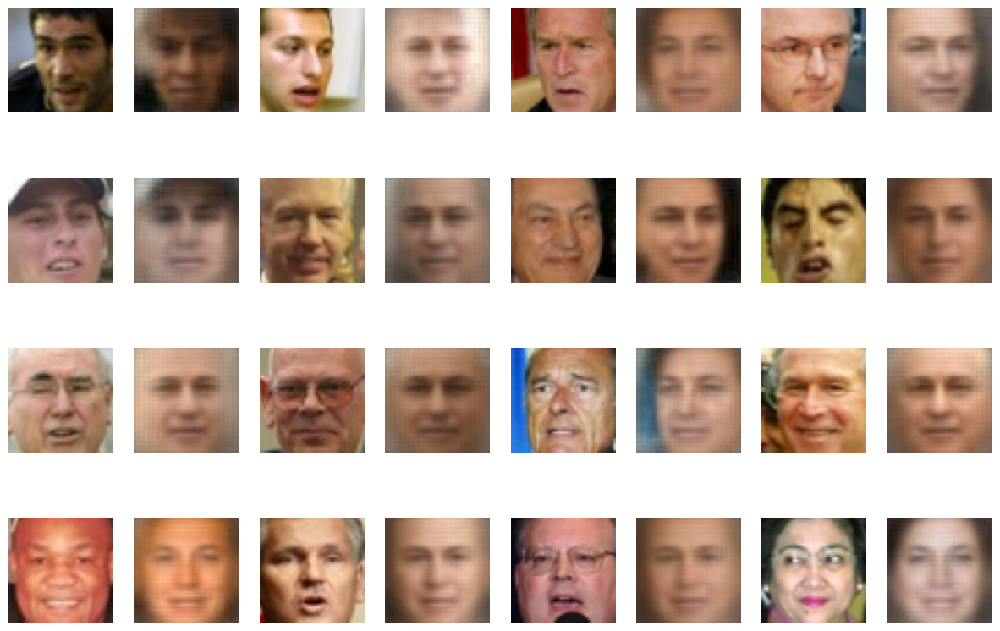

In [51]:
sample_index = random.sample(range(1, len(X_val)), 16)

fig, axs = plt.subplots(4, 8)
fig.set_figheight(10)
fig.set_figwidth(15)

for i in range(4):
    for j in range(4):
        axs[i, 2*j].imshow(X_val[sample_index[4*i+j], :, :, :])
        axs[i, 2*j].axis('off')
        axs[i, 2*j+1].imshow(np.clip(autoencoder.predict(np.array([X_val[sample_index[4*i+j], :, :, :]]))[0],0,1))
        axs[i, 2*j+1].axis('off')

[Your markdown here]

* Do the reconstructed faces resemble the original images? How are they similar/different?

Yes. overall structure and identity cues are similar; fine details such as wrinkles, texture, and sharp edges are blurred or smoothed out-- different.

* Are there any faces that are reconstructed better or worse than the others? Can you think of why?

Faces that are frontal, evenly lit, and have neutral expressions are reconstructed better, as the model likely encountered many similar examples during training.

* Comment on any other aspects of your findings that are interesting to you.

The model tends to average out rare attributes, for example, glasses and facial hair may fade or become faint.

### 1.3 Visualizing the latent space (10 points)

In `vae_demo` from class, the MNIST digits were generated from a two-dimensional latent space. In the current model, the latent space has more than two dimensions, so to visualize it we need to use a dimensionality reduction technique. (If you are not familiar with PCA, please refer to the material for Week 7 of [iML](https://ydata123.org/fa21/iml/calendar.html).)

In this problem, you will first implement the function `LatentSpace_2D`. (6 points)
1. Calculate the latent space encodings for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Use PCA to reduce the dimension of the latent space codes to two.
3. Visualize the latent space after dimensionality reduction with a scatter plot. Clearly color-code and label the two different groups.

Here is an example using smile_data and no_smile_data.
![Sample_1_3](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Sample_1_3.png)

Visualize the latent space for at least three pairs of face groups including smile vs. no smile. Comment on how the scatter plots look.
* Are the two groups separable in the two-dimensional latent space? Is this what you expected? Why or why not? (2 points)
* How do the plots for the three different attributes differ from each other? (2 points)

In [58]:

def LatentSpace_2D(encoder_model, data1, label1, data2, label2):
    """
    Encode two face sets into latent codes, reduce to 2D by PCA, and scatter-plot.
    Works whether the encoder outputs sampled z directly, or has `variational_mean` layer.
    """
    # --- 1) get latent codes (prefer mean μ if available) ---
    def encode_batch(x):
        # Try to fetch μ from a layer named 'variational_mean'
        try:
            mean_layer = encoder_model.get_layer('variational_mean')
            mu_model = tf.keras.Model(encoder_model.input, mean_layer.output)
            z = mu_model.predict(x, verbose=0)
        except Exception:
            # Fall back to encoder's direct output (often the sampled z)
            z = encoder_model.predict(x, verbose=0)
        return z

    z1 = encode_batch(data1.astype('float32'))
    z2 = encode_batch(data2.astype('float32'))

    # --- 2) PCA to 2D (fit on the union to have a shared space) ---
    Z = np.vstack([z1, z2])
    pca = PCA(n_components=2, random_state=42)
    Z2 = pca.fit_transform(Z)
    Z1_2d = Z2[:len(z1)]
    Z2_2d = Z2[len(z1):]

    # --- 3) scatter plot ---
    plt.figure(figsize=(6.5, 5))
    plt.scatter(Z1_2d[:, 0], Z1_2d[:, 1], s=32, alpha=0.8, label=label1)
    plt.scatter(Z2_2d[:, 0], Z2_2d[:, 1], s=32, alpha=0.8, label=label2)
    plt.xlabel('PC1'); plt.ylabel('PC2')
    plt.title(f'Latent space (PCA 2D): {label1} vs {label2}')
    plt.legend()
    plt.grid(True, alpha=0.25)
    plt.tight_layout()
    plt.show()

    return Z1_2d, Z2_2d, pca


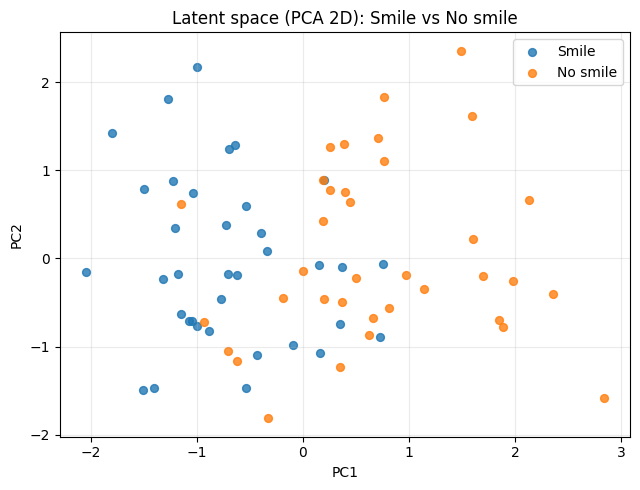

(array([[-1.401089  , -1.471288  ],
        [ 0.72547257, -0.89373636],
        [-1.1501848 , -0.62650585],
        [ 0.3451886 , -0.7394576 ],
        [-1.2095461 ,  0.3432843 ],
        [-1.049148  , -0.7049179 ],
        [-0.6999462 ,  1.2479573 ],
        [-1.2301035 ,  0.8747864 ],
        [ 0.7566728 , -0.05748446],
        [-0.8898334 , -0.82271326],
        [-0.6368332 ,  1.2932732 ],
        [-2.0499876 , -0.1487106 ],
        [-1.2781591 ,  1.8126457 ],
        [-1.0745664 , -0.7045556 ],
        [-1.0409596 ,  0.7421572 ],
        [ 0.19830526,  0.8903379 ],
        [-0.72212946,  0.37431905],
        [-1.8037001 ,  1.4292814 ],
        [-1.5013621 ,  0.7907078 ],
        [-1.3196363 , -0.23709445],
        [-0.53843164,  0.5995241 ],
        [-1.5048586 , -1.4883432 ],
        [-0.62198174, -0.18890856],
        [-0.53441596, -1.4662777 ],
        [ 0.36864948, -0.10120773],
        [-0.3372505 ,  0.07999112],
        [-1.0011201 , -0.7621303 ],
        [ 0.15594292, -1.069

In [60]:
LatentSpace_2D(encoder_model, smile_data, 'Smile', no_smile_data, 'No smile')

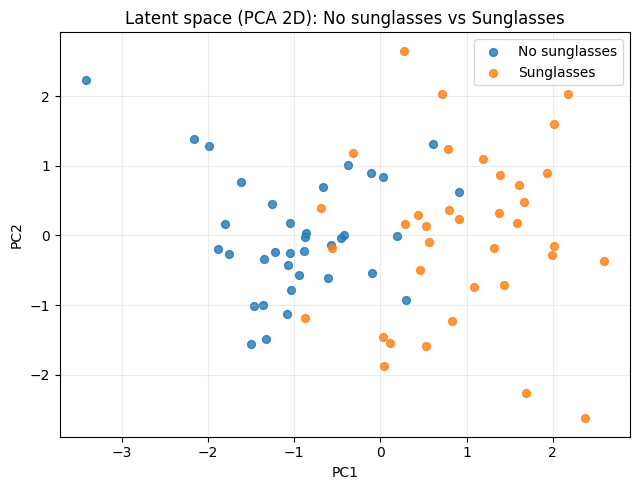

(array([[-1.4625930e+00, -1.0094748e+00],
        [-3.7283939e-01,  1.0108373e+00],
        [-1.5023566e+00, -1.5612217e+00],
        [-1.8082260e+00,  1.5989813e-01],
        [-1.3604493e+00, -9.9642015e-01],
        [-1.2285489e+00, -2.3094854e-01],
        [ 2.6315721e-02,  8.4145743e-01],
        [-1.0514164e+00,  1.7480162e-01],
        [ 9.1647476e-01,  6.2405264e-01],
        [-5.7537556e-01, -1.4177382e-01],
        [-3.4196334e+00,  2.2360952e+00],
        [-1.0814376e+00, -1.1331879e+00],
        [-9.3759060e-02, -5.3972965e-01],
        [-1.8841959e+00, -1.9949783e-01],
        [-2.1607497e+00,  1.3884597e+00],
        [ 2.9242876e-01, -9.2489403e-01],
        [-1.6176335e+00,  7.6106137e-01],
        [-9.4165295e-01, -5.6892443e-01],
        [-1.9886340e+00,  1.2895248e+00],
        [-1.3292327e+00, -1.4909683e+00],
        [-4.5828086e-01, -3.8701974e-02],
        [-1.0375631e+00, -7.8858560e-01],
        [-1.7593751e+00, -2.6492319e-01],
        [-1.3467617e+00, -3.445188

In [54]:
LatentSpace_2D(encoder_model,smile_data,'No sunglasses',sunglasses_data,'Sunglasses')

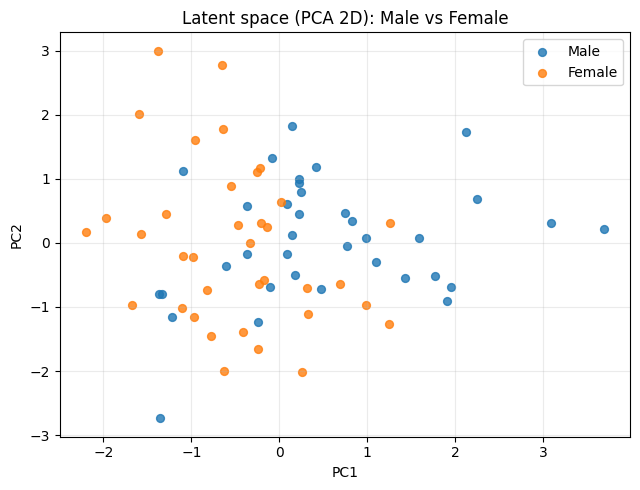

(array([[ 0.8240397 ,  0.33786088],
        [-0.36527705,  0.5797023 ],
        [-0.10682757, -0.68601096],
        [ 3.093544  ,  0.30323282],
        [ 3.6920433 ,  0.21193537],
        [ 0.22502998,  0.93522525],
        [ 2.1221554 ,  1.7234429 ],
        [-0.6095844 , -0.35398066],
        [ 0.22382204,  0.9976718 ],
        [ 1.9019532 , -0.90788174],
        [-1.3388902 , -0.79593235],
        [ 0.47041163, -0.7268418 ],
        [-0.08551626,  1.3175893 ],
        [ 0.08291291,  0.6114532 ],
        [ 0.98526835,  0.06873535],
        [ 1.5853395 ,  0.07301779],
        [ 2.249692  ,  0.6851742 ],
        [-1.0902606 ,  1.1271793 ],
        [ 0.7434527 ,  0.4729845 ],
        [ 1.7729828 , -0.5165806 ],
        [ 1.9465421 , -0.69061154],
        [-0.36972043, -0.1770824 ],
        [-1.2202431 , -1.1631892 ],
        [-1.3606378 , -2.7366915 ],
        [ 0.24253736,  0.7966785 ],
        [ 0.1474708 ,  0.11733847],
        [-1.3694302 , -0.8030316 ],
        [ 1.4242365 , -0.552

In [55]:
LatentSpace_2D(encoder_model,male_data,'Male',female_data,'Female')

[Your markdown here]

Visualize the latent space for at least three pairs of face groups including smile vs. no smile. Comment on how the scatter plots look.
* Are the two groups separable in the two-dimensional latent space? Is this what you expected? Why or why not? (2 points)

Yes, they are partial separability. This is what I expected.

For Smile vs No smile, the two clusters are separated along one principal direction, indicating that the VAE has captured facial features related to smiling. However, there is still overlap because subtle expressions are not perfectly distinct in the compressed latent representation.

For Sunglasses vs No sunglasses, the separation is more noticeable. This makes sense because the presence of sunglasses introduces a strong and visually distinct feature, which the model can easily encode.

For Male vs Female, the overlap is larger, reflecting that gender is a more complex and distributed feature

* How do the plots for the three different attributes differ from each other? (2 points)

Smile vs No smile: Moderate separation; clusters are distinguishable but overlapping, suggesting the model partially learned the smile feature.

Sunglasses vs No sunglasses: Strongest separation among the three, the latent variables effectively encode the presence of sunglasses as a dominant feature.

Male vs Female: Least separable, the latent representations of male and female faces are widely mixed, indicating that gender information is distributed across multiple latent dimensions rather than captured by a single axis.

### 1.4 Morphing between faces (4 points)

Morph at least 5 pairs of faces with the function `morphBetweenImages` and comment on what you observe.
* Briefly explain how the morphing works. (2 points)
* Do the generated faces look like what you expected? Does any of the pairs work better than the others? If so, what kind of image pairs work better? (2 points)

In [61]:
# Don't change the function
def morphBetweenImages(img1, img2, num_of_morphs):
    alpha = np.linspace(0,1,num_of_morphs)
    z1 = encoder_model.predict(np.array([img1]))
    z2 = encoder_model.predict(np.array([img2]))
    fig = plt.figure(figsize=(30,5))

    ax = fig.add_subplot(1, num_of_morphs+2, 1)
    ax.imshow(img1)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 1',fontsize=10)

    for i in range(num_of_morphs):
        z = z1*(1-alpha[i]) + z2*alpha[i]
        new_img = decoder_model.predict(z)

        ax = fig.add_subplot(1, num_of_morphs+2, i+2)
        ax.imshow(np.clip(new_img.squeeze(),0,1))
        ax.axis('off')
        ax.set_title(loc='center', label='alpha={:.2f}'.format(alpha[i]))

    ax = fig.add_subplot(1, num_of_morphs+2, num_of_morphs+2)
    ax.imshow(img2)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 2',fontsize=10)
    return

1. Briefly explain how the morphing works. (2 points)

We first encode both images with the VAE encoder to obtain their latent vectors $ z_1 $ and $ z_2 $.

We then compute a sequence of intermediate latent vectors by linear interpolation:

$$
z(\alpha) = (1 - \alpha) z_1 + \alpha z_2, \quad \alpha \in [0, 1].
$$

Each $ z(\alpha) $ is decoded by the VAE decoder into an image, producing a smooth transition from image 1 to image 2.

Because the VAE regularizes the latent space towards $ N(0, I) $, the interpolation tends to stay on the data manifold and yields plausible faces.


2. Do the generated faces look like what you expected? Does any of the pairs work better than the others? If so, what kind of image pairs work better? (2 points)

Overall, the generated faces behave as expected, the transitions between the two original faces are smooth and continuous, showing gradual changes in identity, pose, and facial features as the interpolation coefficient alpha increases from 0 to 1.

For the first and second pairs, the morphing works relatively well.

pairs with similar pose, lighting, and face structure work better.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


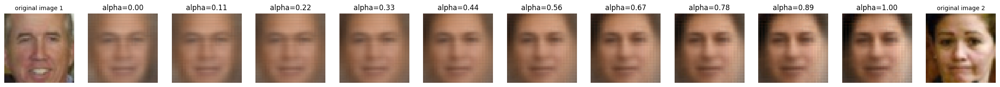

In [66]:
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


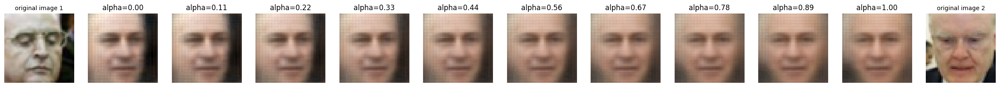

In [73]:
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


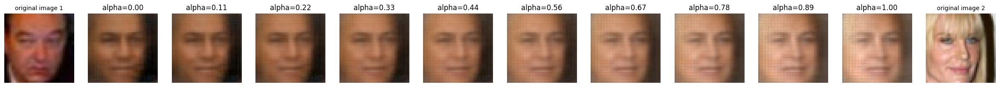

In [64]:
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


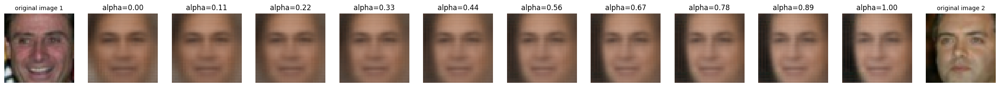

In [63]:
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


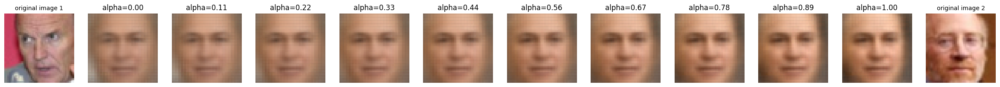

In [62]:
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

### 1.5 Attribute shift (10 points)

In 1.3, we've seen that faces with the same attributes form clusters in the latent space. In this problem, you will implement a function `AttributeShift` to change one attribute of the faces.

First implement the function `AttributeShift`. (5 points)
1. Calculate the latent space codes for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Calculate the mean latent space code for each group.
3. Get the attribute shifting vector by taking the difference between the two codes.
4. Perform attribute shift by adding the attribute shifting vector to the latent space code of the faces you want to modify.
5. Generate the image using the new latent space codes.

Here is a diagram demonstrating the shift in the latent space. Please note that the two-dimensional latent space is just for demonstration purpose. You should *not* use PCA in this problem. Instead, use the original latent space.
![Diagram_1_5](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Diagram_1_5.png)

Perform attribute shift on at three attributes including smile. Comment on the faces with shifted attributes. (5 points)
1.  Do the generated faces look like what you expected? If not, can you think of some possible reasons?

Yes, broadly. After the shift, faces tend to show the target attribute (e.g., slightly up-turned mouth corners for smile), while remaining plausible.

Changes are subtle and a bit blurry, which is expected for VAEs trained with pixel MSE + KL which avor smooth, average-looking reconstructions.

However, Pose/lighting/occlusion differences (caps, extreme angles) confound the shift; And sometimes attributes are not fully disentangled in the latent space


2.  Do the faces with new attributes resemble the original faces? If not, can you think of some possible reasons?

Mostly yes, but fine details (skin texture, sharp edges) are softened; occasionally the identity drifts a bit.

Reasons: VAE’s smoothing, plus the shift moves images within the manifold toward the class mean, which can pull them toward a more average face.



3.  Which of the attribute shift is more successful? What are some possible reasons?

Sunglasses is most successful: the signal is strong, localized, and visually consistent, so the latent direction is clear.

Gender is weakest: it’s a broad, multi-factor concept (shape, hair, makeup, age cues) and harder to capture with a single linear direction.


4.  Comment on any other aspects of your findings that are interesting to you.

Results improve when the source faces are frontal, well-lit, and unoccluded (latent codes are closer to the class mean and interpolation path is shorter).

In [74]:
# Don't change this helper function!
def PlotAttributeShift(data2,pic_output):
    sample_index = random.sample(range(1, len(data2)), 16)

    fig, axs = plt.subplots(4, 8)
    fig.set_figheight(10)
    fig.set_figwidth(15)

    for i in range(4):
        for j in range(4):
            axs[i, 2*j].imshow(data2[sample_index[4*i+j], :, :, :])
            axs[i, 2*j].axis('off')
            axs[i, 2*j+1].imshow(np.clip(pic_output[sample_index[4*i+j]],0,1))
            axs[i, 2*j+1].axis('off')

In [75]:
def AttributeShift(encoder_model, decoder_model, data1, data2):
    # 1. Encode both groups into latent space
    z1 = encoder_model.predict(data1)
    z2 = encoder_model.predict(data2)

    # 2. Compute mean latent vector for each group
    mean1 = np.mean(z1, axis=0)   # e.g. smile
    mean2 = np.mean(z2, axis=0)   # e.g. no smile

    # 3. Compute the attribute shift vector
    shift_vector = mean1 - mean2  # direction: no smile → smile

    # 4. Apply the shift to target data (data2)
    z2_shifted = z2 + shift_vector

    # 5. Decode the shifted latent codes back into images
    pic_output = decoder_model.predict(z2_shifted)

    return pic_output


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 346ms/step


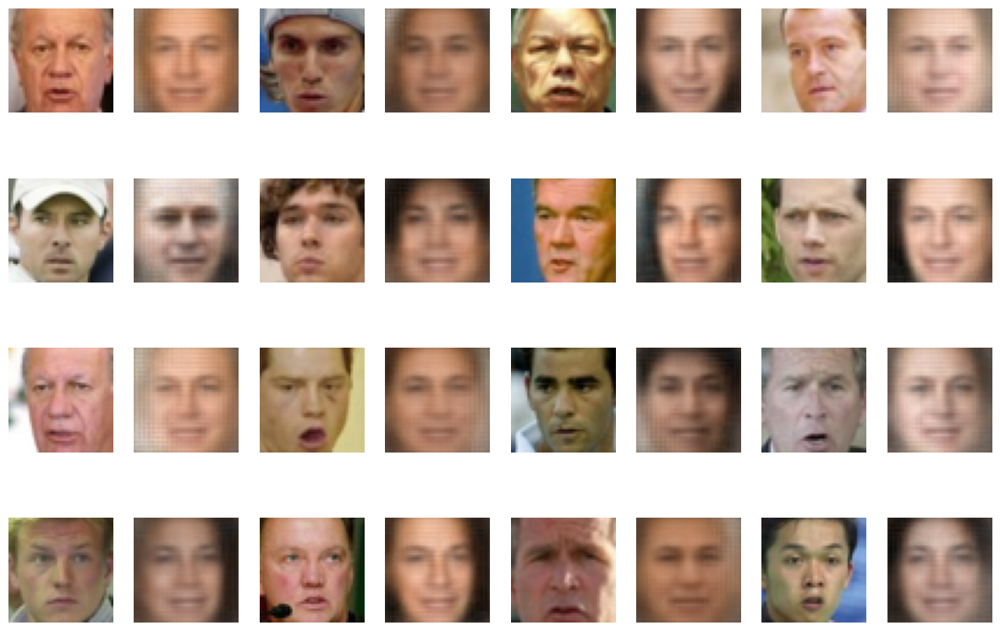

In [76]:
pic_output = AttributeShift(encoder_model,decoder_model,smile_data,no_smile_data)
PlotAttributeShift(no_smile_data,pic_output)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


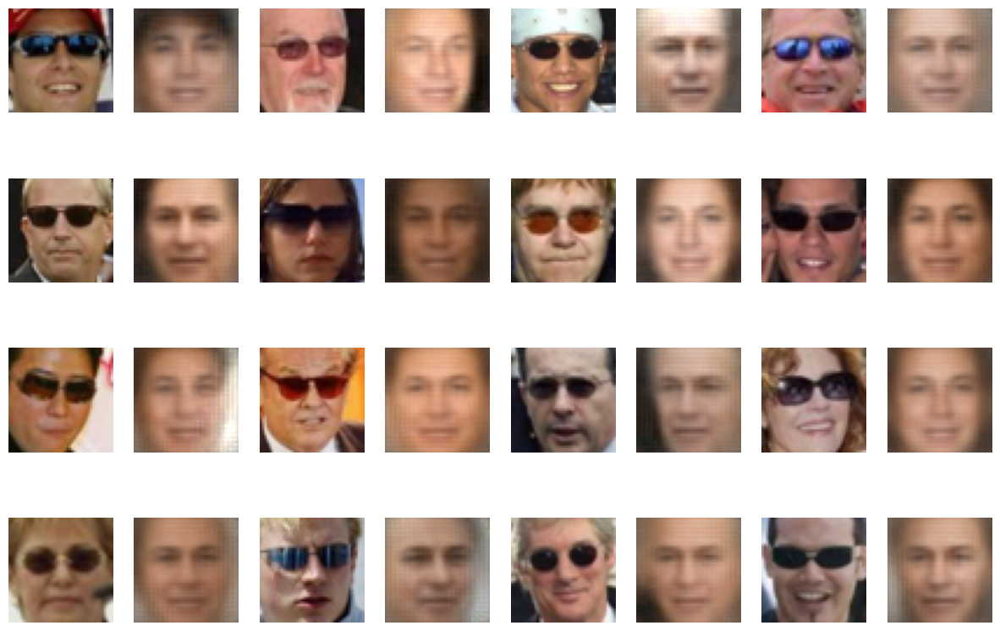

In [78]:
pic_output = AttributeShift(encoder_model,decoder_model,eyeglasses_data,sunglasses_data)
PlotAttributeShift(sunglasses_data,pic_output)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


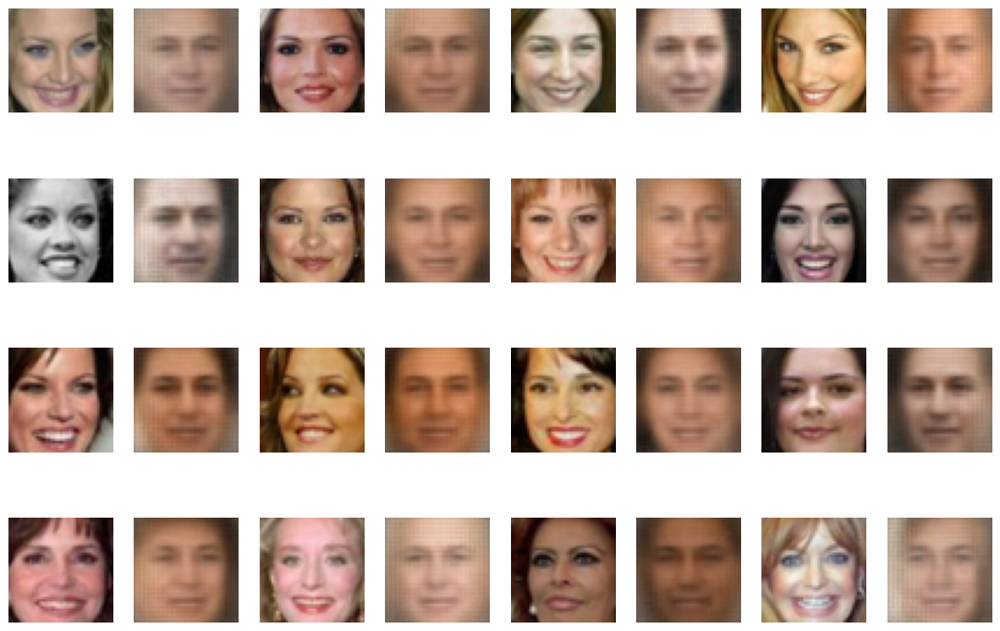

In [79]:
pic_output = AttributeShift(encoder_model,decoder_model,male_data,female_data)
PlotAttributeShift(female_data,pic_output)

[Your markdown here]
Perform attribute shift on at three attributes including smile. Comment on the faces with shifted attributes. (5 points)
1.  Do the generated faces look like what you expected? If not, can you think of some possible reasons?

Yes, broadly. After the shift, faces tend to show the target attribute (e.g., slightly up-turned mouth corners for smile), while remaining plausible.

Changes are subtle and a bit blurry, which is expected for VAEs trained with pixel MSE + KL which avor smooth, average-looking reconstructions.

However, Pose/lighting/occlusion differences (caps, extreme angles) confound the shift; And sometimes attributes are not fully disentangled in the latent space


2.  Do the faces with new attributes resemble the original faces? If not, can you think of some possible reasons?

Mostly yes, but fine details (skin texture, sharp edges) are softened; occasionally the identity drifts a bit.

Reasons: VAE’s smoothing, plus the shift moves images within the manifold toward the class mean, which can pull them toward a more average face.



3.  Which of the attribute shift is more successful? What are some possible reasons?

Sunglasses is most successful: the signal is strong, localized, and visually consistent, so the latent direction is clear.

Gender is weakest: it’s a broad, multi-factor concept (shape, hair, makeup, age cues) and harder to capture with a single linear direction.


4.  Comment on any other aspects of your findings that are interesting to you.

Results improve when the source faces are frontal, well-lit, and unoccluded (latent codes are closer to the class mean and interpolation path is shorter).

### 1.6 Generating new faces (3 points)

Variational autoencoders can be used to generate new data; this is why they are generative models. We can sample new data points from the distribution in latent space and reconstruct new, fake faces based on them.

To draw a sample close to an existing sample in the latent space, we can add a scaled random sample from the normal distribution to the latent space code of an existing sample. The scalar, which we call the `noise_level` is a parameter that we can tune.

Run `GenerateFaces` with three different values of `noise_level` and comment on the generated faces. (3 points)
* Do the generated images look like faces?
* What happens when the new samples diverge more from the existing samples? What is a possible reason?

In [85]:
def GenerateFaces(data, LATENT_SPACE_SIZE, noise_level):
    sample_index = random.sample(range(1, len(data)), 15)
    latent_space = noise_level*np.random.normal(size=(15,LATENT_SPACE_SIZE))+encoder_model.predict(data[sample_index])
    generated_image = decoder_model.predict(latent_space)
    fig = plt.figure(figsize=(15,10))
    number_of_images = 15
    for i in range(number_of_images):
        ax = fig.add_subplot(3, 5, i+1)
        ax.imshow(np.clip(generated_image[i, :,:,:],0,1))
        ax.axis('off')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


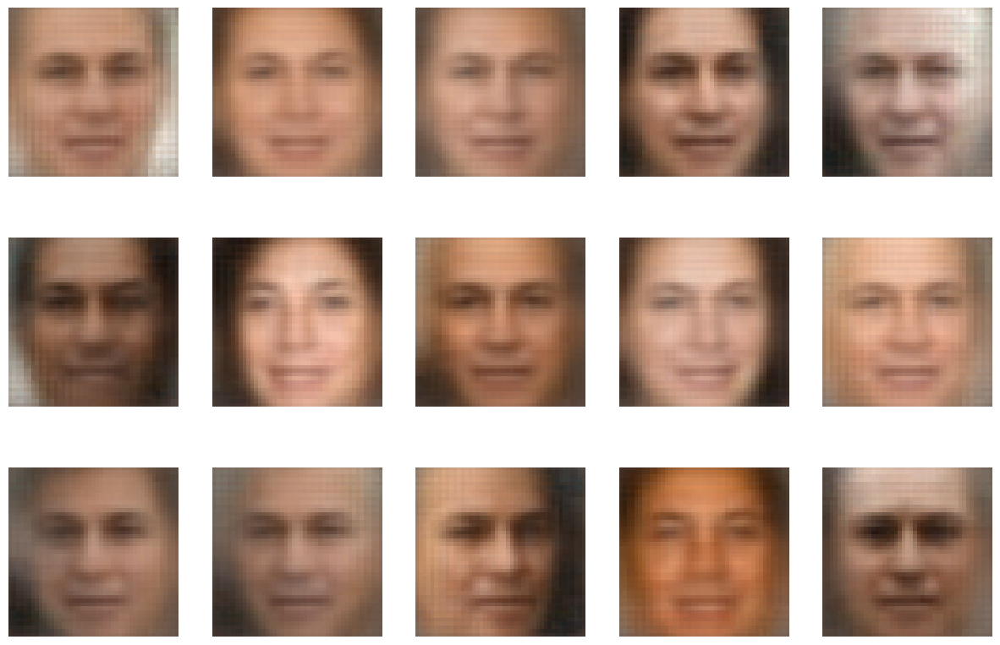

In [86]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


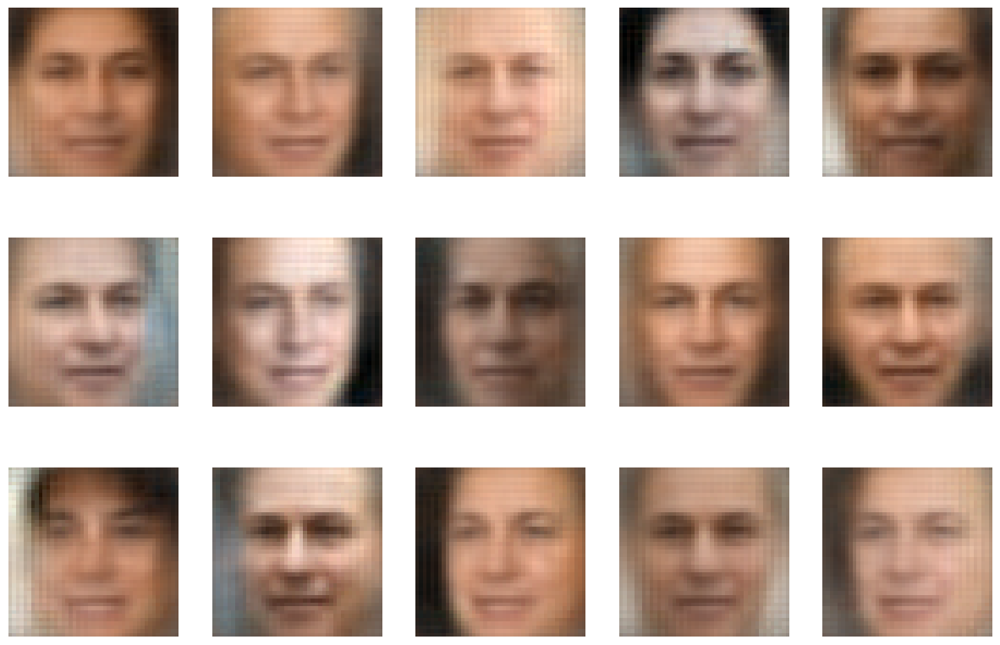

In [87]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


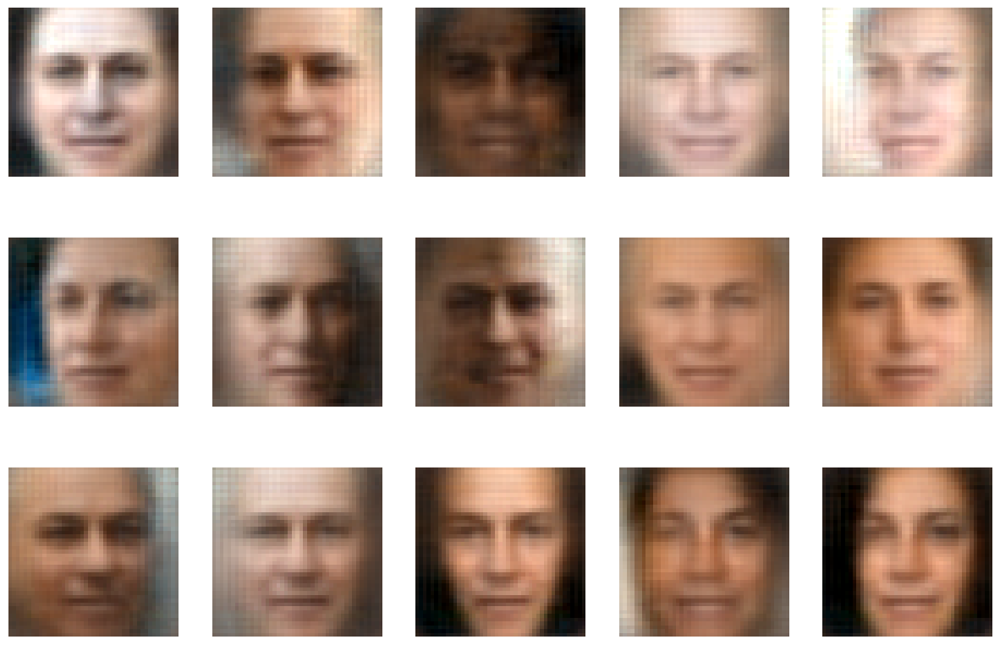

In [88]:
GenerateFaces(data,LATENT_SPACE_SIZE,1)

# Your markdown here

1. Do the generated images look like faces?

noise level = 0.1, the generated images look realistic and clearly resemble human faces.

noise level = 0.5, the generated faces still look like humans but start to show noticeable distortions.

noise level = 1.0, the images become much less realistic.


2. What happens when the new samples diverge more from the existing samples? What is a possible reason?

As the noise level increases, the sampled latent vectors move further away from the well-trained region of the latent space; The decoder has not seen such extreme latent codes during training, so it cannot reconstruct realistic images, resulting in blurred or distorted faces.

This behavior illustrates a core property of VAEs: They model data as lying near a low-dimensional Gaussian manifold, and realistic samples are produced only near the latent distribution $N (0,I)$ that the model learned from real data.

### Optional: Changing the loss function (2 points extra credit)

The variable `factor` is a parameter of the loss function. In this optional problem, you will play with it and think about its effect on the performance of VAE.

Retrain the model with a smaller factor. Repeat 1.2, 1.6 (using `noise_level` = 1) and latent space visualization. Comment on how the reconstruction results, generated new faces and latent space distributions change. (2 points)
* Which model reconstructs the faces better?
* Do the generated faces look different?
* How do the latent variable distributions differ?
* Do the differences make sense? Can you explain what you observed?

Epoch 1/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.0138 - val_loss: 0.0120
Epoch 2/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0116 - val_loss: 0.0116
Epoch 3/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0113 - val_loss: 0.0113
Epoch 4/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 5/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0107 - val_loss: 0.0107
Epoch 6/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0103 - val_loss: 0.0104
Epoch 7/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0101 - val_loss: 0.0102
Epoch 8/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0099 - val_loss: 0.0101
Epoch 9/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0098 - val_loss: 0.0099
Epoch 10/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0097 - val_loss: 0.0099
Epoch 11/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0095 - val_loss: 0.0099
Epoch 12/20
165/165 ━━━━━━━━━━━━━━━━━━━━

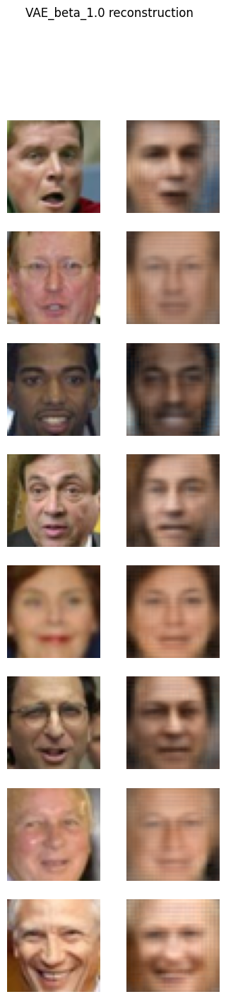

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


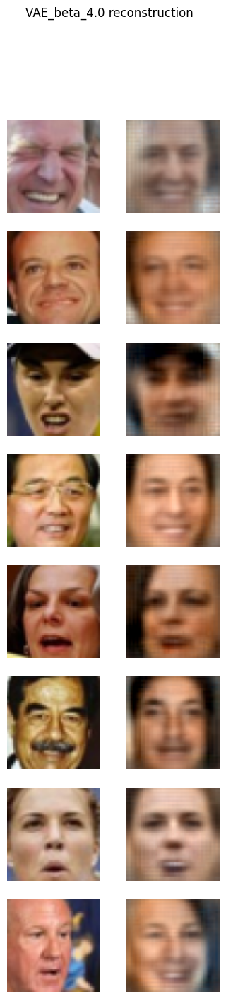

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


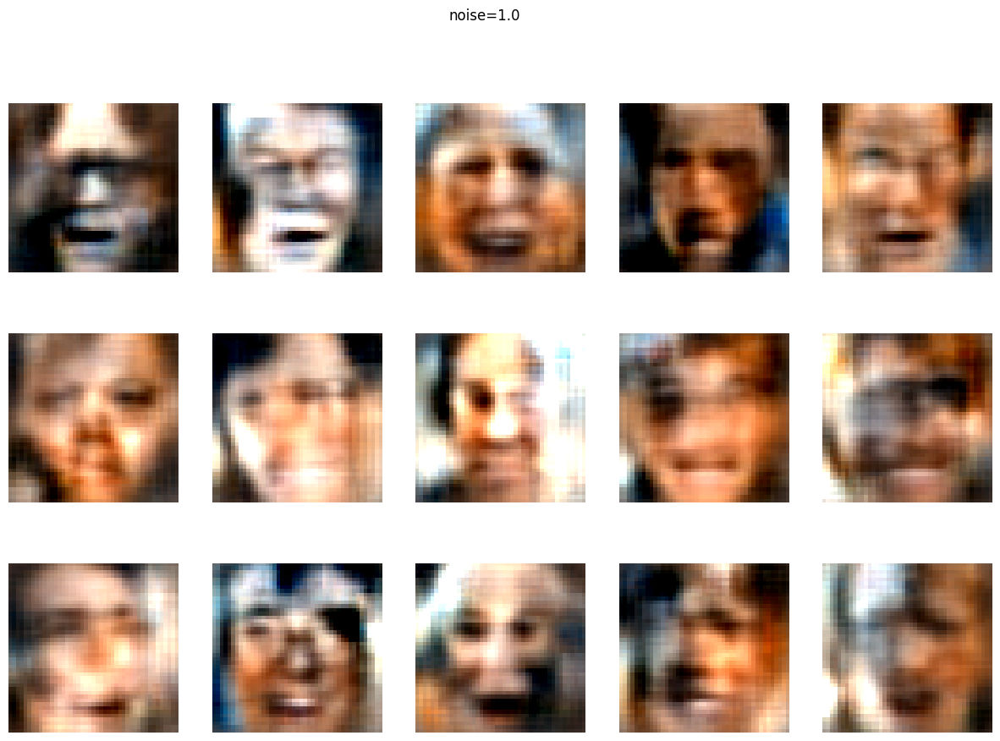

In [91]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import random

# ==== 1) KL Loss layer with beta ====
class BetaKLLoss(layers.Layer):
    def __init__(self, beta=1.0, name="beta_kl_loss", **kwargs):
        super().__init__(name=name, **kwargs)
        self.beta = beta

    def call(self, inputs):
        mu, logvar = inputs
        kl = -0.5 * tf.reduce_sum(1 + logvar - tf.square(mu) - tf.exp(logvar), axis=-1)
        self.add_loss(self.beta * tf.reduce_mean(kl))
        return inputs

# ==== 2) Build new VAE with custom beta ====
def build_autoencoder_with_beta(encoder_model, decoder_model, beta=1.0):
    x_in = encoder_model.inputs[0]
    mu = encoder_model.get_layer("variational_mean").output
    logvar = encoder_model.get_layer("variational_log_variance").output

    _ = BetaKLLoss(beta=beta)([mu, logvar])   # add KL term
    z = encoder_model.output
    x_out = decoder_model(z)
    return keras.Model(x_in, x_out, name=f"VAE_beta_{beta}")

# ==== 3) Reconstruction loss ====
def reconstruction_loss(y_true, y_pred):
    per_pixel = tf.reduce_mean(tf.square(y_true - y_pred), axis=-1)
    return tf.reduce_mean(per_pixel)

# ==== 4) Train with two different betas ====
ae_beta1 = build_autoencoder_with_beta(encoder_model, decoder_model, beta=1.0)
ae_beta1.compile(optimizer="adam", loss=reconstruction_loss)
ae_beta1.fit(X_train, X_train, epochs=20, batch_size=64, validation_data=(X_val, X_val))

ae_beta4 = build_autoencoder_with_beta(encoder_model, decoder_model, beta=4.0)
ae_beta4.compile(optimizer="adam", loss=reconstruction_loss)
ae_beta4.fit(X_train, X_train, epochs=20, batch_size=64, validation_data=(X_val, X_val))

# ==== 5) Reconstruction comparison ====
def compare_reconstruction(auto, X_val, n=8):
    idx = random.sample(range(len(X_val)), n)
    fig, axs = plt.subplots(n, 2, figsize=(4, n*2))
    for i in range(n):
        axs[i,0].imshow(X_val[idx[i]]); axs[i,0].axis('off')
        axs[i,1].imshow(np.clip(auto.predict(X_val[idx[i]][None,...])[0],0,1)); axs[i,1].axis('off')
    plt.suptitle(auto.name + " reconstruction")
    plt.show()

compare_reconstruction(ae_beta1, X_val)
compare_reconstruction(ae_beta4, X_val)

# ==== 6) Generate faces (noise=1) ====
def GenerateFaces(data, LATENT_SPACE_SIZE, noise_level, encoder_model, decoder_model):
    sample_index = random.sample(range(1, len(data)), 15)
    z = encoder_model.predict(data[sample_index])
    latent_space = z + noise_level * np.random.normal(size=z.shape)
    generated = decoder_model.predict(latent_space)
    fig = plt.figure(figsize=(15, 10))
    for i in range(15):
        ax = fig.add_subplot(3, 5, i+1)
        ax.imshow(np.clip(generated[i], 0, 1)); ax.axis("off")
    plt.suptitle(f"noise={noise_level}")
    plt.show()

GenerateFaces(X_val, LATENT_SPACE_SIZE, 1.0, encoder_model, decoder_model)



In [ ]:
# Your code here

[Your markdown here]

Retrain the model with a smaller factor. Repeat 1.2, 1.6 (using `noise_level` = 1) and latent space visualization. Comment on how the reconstruction results, generated new faces and latent space distributions change. (2 points)
1. Which model reconstructs the faces better?

The model with β = 1.0 reconstructs faces more sharply and preserves details better.

The model with β = 4.0 produces smoother but blurrier images because the KL regularization is stronger, forcing the latent variables closer to the standard normal prior

2. Do the generated faces look different?

Yes. For β = 4.0, the generated faces appear more “average” and consistent, while for β = 1.0 they show more diversity but sometimes contain unrealistic artifacts.

3. How do the latent variable distributions differ?

β = 4.0 has a more compact latent distribution


4. Do the differences make sense? Can you explain what you observed?

Yes. Increasing β emphasizes the KL divergence term, enforcing a smoother, more regular latent space at the cost of pixel-level accuracy



## Problem 2: Gaussian neighborhood regression (10 points)
In multivariate Gaussians, edges are about *direct* relationships after controlling for all other variables. The conditional law of a single coordinate $X_i$ given the rest $X_{-i}$ reveals which variables directly “enter” the model for $X_i$. Algebraically, this local behavior is encoded by the $i$th row/column of the precision matrix $\Omega=\Sigma^{-1}$.  Graphical Lasso estimates a sparse precision matrix $\widehat{\Omega}$ by maximizing the Gaussian log-likelihood with an $\ell_1$ penalty on off-diagonal entries. Zeros in $\widehat{\Omega}$ correspond to missing edges (conditional independences) in the learned graph.



Let $X=(X_1,\dots,X_p)^\top \sim \mathcal N_p(0,\Sigma)$, and write $\Omega=\Sigma^{-1}$. For $i\in\{1,\dots,p\}$, denote $-i=\{1,\dots,p\}\setminus\{i\}$.




### 2.1 Conditional law of one node.
Show that $X_i\mid X_{-i}$ is Gaussian with a linear mean in $X_{-i}$. Express the regression coefficients $\beta_{i\leftarrow -i}\in\mathbb{R}^{p-1}$ and the conditional variance $\sigma^2_{i\mid -i}$ in terms of $\Omega$.


*Hint.* You may *complete the square* on $x^\top\Omega x$, or use a *Schur complement* derivation. After permuting coordinates so that $i$ is first, partition
$$
\Sigma \;=\; \begin{bmatrix}
a & b^\top \\[4pt]
b & C
\end{bmatrix},
\quad
a=\Sigma_{ii}\in\mathbb{R},\; b=\Sigma_{-i,i}\in\mathbb{R}^{p-1},\; C=\Sigma_{-i,-i}\in\mathbb{R}^{(p-1)\times(p-1)}.
$$
**Schur complement.** If $C$ is invertible (it is, since $\Sigma\succ 0$), the Schur complement of $C$ in $\Sigma$ is
$$
S \;:=\; a - b^\top C^{-1} b .
$$
**Block inversion formula.** Then
$$
\Sigma^{-1}
=\begin{bmatrix}
S^{-1} & -\,S^{-1} b^\top C^{-1}\\[4pt]
-\,C^{-1} b S^{-1} & C^{-1} + C^{-1} b S^{-1} b^\top C^{-1}
\end{bmatrix}.
$$

# 2.1 — Detailed Derivation


---

## Step 0. Notation and Partition

After reordering coordinates so that variable $$i$$ is first, write
$$
X =
\begin{bmatrix}
X_i \\[2pt] X_{-i}
\end{bmatrix},
\qquad
x =
\begin{bmatrix}
x_i \\[2pt] x_{-i}
\end{bmatrix}.
$$

Partition the covariance matrix as
$$
\Sigma =
\begin{bmatrix}
a & b^\top \\[2pt]
b & C
\end{bmatrix},
\qquad
a = \Sigma_{ii}, \;\; b = \Sigma_{-i,i}, \;\; C = \Sigma_{-i,-i}.
$$

and its inverse (the precision matrix)
$$
\Omega = \Sigma^{-1} =
\begin{bmatrix}
\Omega_{ii} & \Omega_{i,-i} \\[2pt]
\Omega_{-i,i} & \Omega_{-i,-i}
\end{bmatrix}.
$$

---

## Step 1. Start from the joint Gaussian density

For a zero-mean multivariate Gaussian,
$$
p(x) \propto \exp\!\Big(-\tfrac{1}{2}\,x^\top \Omega\,x\Big).
$$

Expand the quadratic form with respect to $$x_i$$:
$$
x^\top \Omega\,x
= \Omega_{ii}x_i^2 + 2x_i\,\Omega_{i,-i}\,x_{-i} + x_{-i}^\top \Omega_{-i,-i}\,x_{-i}.
$$

---

## Step 2. Complete the square in $$x_i$$

Complete the square:
$$
\Omega_{ii}x_i^2 + 2x_i\,\Omega_{i,-i}\,x_{-i}
=
\Omega_{ii}\Big(x_i + \Omega_{ii}^{-1}\Omega_{i,-i}x_{-i}\Big)^2
- \Omega_{ii}^{-1}(\Omega_{i,-i}x_{-i})^2.
$$

Hence, up to constants independent of $$x_i$$,
$$
p(x_i \mid x_{-i}) \propto
\exp\!\Big(
-\tfrac{1}{2}\,\Omega_{ii}\big(x_i + \Omega_{ii}^{-1}\Omega_{i,-i}x_{-i}\big)^2
\Big).
$$

This shows that the conditional distribution is Gaussian:
$$
X_i \mid X_{-i} \sim
\mathcal N\!\Big(-\,\Omega_{ii}^{-1}\Omega_{i,-i}X_{-i},\, \Omega_{ii}^{-1}\Big).
$$

---

## Step 3. Identify regression coefficients and conditional variance

By comparing with the generic conditional form
$$
X_i \mid X_{-i} \sim
\mathcal N\!\big(\beta_{i\leftarrow -i}^\top X_{-i},\, \sigma^2_{i\mid -i}\big),
$$
we can directly read off:
$$
\beta_{i\leftarrow -i} = -\,\frac{\Omega_{-i,i}}{\Omega_{ii}},
\qquad
\sigma^2_{i\mid -i} = \frac{1}{\Omega_{ii}}.
$$

---

## Step 4. Verification via Schur complement (optional)

Let the Schur complement be
$$
S = a - b^\top C^{-1}b.
$$

The block inversion formula gives
$$
\Omega_{ii} = S^{-1},
\qquad
\Omega_{-i,i} = -\,C^{-1}b\,S^{-1}.
$$
Therefore,
$$
\frac{1}{\Omega_{ii}} = S = a - b^\top C^{-1}b,
\qquad
-\,\frac{\Omega_{-i,i}}{\Omega_{ii}} = C^{-1}b,
$$
which matches the covariance-based conditional mean and variance:
$$
\beta_{i\leftarrow -i} = C^{-1}b,
\qquad
\sigma^2_{i\mid -i} = a - b^\top C^{-1}b.
$$

---

## Step 5. Final regression form

Hence, the conditional law can be viewed as a **neighborhood regression**:
$$
X_i = \beta_{i\leftarrow -i}^\top X_{-i} + \varepsilon_i,
\qquad
\varepsilon_i \,\perp\, X_{-i},\;\;
\varepsilon_i \sim \mathcal N\!\Big(0,\, \frac{1}{\Omega_{ii}}\Big),
$$
where
$$
\beta_{i\leftarrow -i} = -\,\frac{\Omega_{-i,i}}{\Omega_{ii}}.
$$

From a graphical model perspective, if $$\Omega_{ij}=0$$,  
then the corresponding regression coefficient is zero, meaning $$X_i$$ and $$X_j$$ are **conditionally independent** given the other variables.



### 2.2 One neighbor at a time.
Fix $j\neq i$. First prove that the coefficient of $X_j$ in the mean of $X_i \mid X_{-i}$ equals zero if and only if $\Omega_{ij}=0$. Then deduce (Gaussian case) that
$$\Omega_{ij}=0 \quad\Longleftrightarrow\quad X_i\ \perp\ X_j\ \big|\ X_{-(i,j)}.$$


*Hint:* Use the result from 2.1. *“iff” ($\Longleftrightarrow$) means:* prove **both** directions (⇒ and ⇐).  


[Your markdown here]


### 2.3 Factorization and graph structure
Suppose every coefficient in the mean of $X_i\mid X_{-i}$ is zero (i.e., $\beta_{i\leftarrow -i}=0$). Show that the joint density factorizes as $p(x)=p(x_i)\,p(x_{-i})$. Briefly interpret the implication **for the graph structure**.

[Your markdown here]

## Problem 3: Taking stock (15 points)

A joint distribution of data has a natural graph associated with it. When the distribution is multivariate normal, this graph is encoded in the pattern of zeros and non-zeros in the inverse of the covariance matrix, also known as the "precision matrix."

In class we demonstrated the graphical lasso for estimating the graph on ETF data.
In this problem you will construct two different "portfolios" of stocks,
and run the graphical lasso to estimate a graph, commenting on your results.

All of the code you might need for this is contained in the demo.


## Data provided

As demonstrated in class, you will run on equities data downloaded from Yahoo Finance. Your job is to construct two “portfolios” of stocks, each with some organizing principle (e.g., sectors, regions, indices vs. equities). Each portfolio must contain **at least 20 stocks**. The page https://en.wikipedia.org/wiki/List_of_S%26P_500_companies has GICS sectors, which you may find useful for the glasso problem.


You are provided two CSV files containing stock prices **since 2021-09-10 (post-COVID start)**:
- [full_stock_daily.csv](https://raw.githubusercontent.com/YData123/sds365-fa25/main/assignments/assn3/full_stock_daily.csv) (rows = dates, columns = **ticker** symbols; daily close)
- [full_stock_weekly.csv](https://raw.githubusercontent.com/YData123/sds365-fa25/main/assignments/assn3/full_stock_weekly.csv) (rows = dates, columns = **ticker** symbols; weekly close = last available trading day of the week)

> **Note on NAs.** Some symbols begin trading after 2021-09-10, so their early entries will be `NA`. Handle missingness during preprocessing (see checklist below).  

> You can look up prices by ticker and date directly from these CSVs. If a needed symbol is **not** in the CSVs, use the provided **R file** `stock_price_from_yahoo_finance.r` to fetch it (via BatchGetSymbols) and merge it into your working data.

**Preprocessing checklist (concise):**
- Select your symbols; **align dates** across symbols.
- For the analysis window you choose, **filter** symbols with poor coverage (e.g., keep ≥90–95% non-missing).
- Build a **complete-cases** matrix for Graphical Lasso (no NAs across chosen symbols/dates).

### Analyzing  your portfolios

Your task is to analyze each porfolio using the graphical lasso, and comment on your findings.
Here are the types of questions you should address:

* How did you choose the portolio? How did you choose the date range and frequency (daily, weekly, etc.)? Remember, each of the portfolios must contain at least 20 stocks, and be organized in some reasonable way.

* Display the graph obtained with the graphical lasso, using networkx. How did you choose the regularization level? Does the structure of the graph make sense? Is it sensitive to the choice of regularization level? Is this the structure you expected to see when you designed the portfolio? Why or why not?

* What are some of the conditional independence assumptions implied by the graph? Are some parts of the graph more densely connected than others? Why?


